In [1]:
import numpy as np
import pandas as pd
import math as ma
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

# Task 2

In [2]:
func2d=pd.read_csv("function1_2d.csv",index_col = 0)

## 2.1 Generating the polynomial basis functions of degrees 2, 3 and 6: ( Sp to dataset 2)

In [3]:
### Creating the polynomial basis functions of degree M and number of examples = n:

def create_phi(M,n,x1,x2):
    d=2
    D = int(ma.factorial(d+M)/(ma.factorial(d)*ma.factorial(M)))
    phi = np.zeros((n,D))
    
    if M == 2:
        exp_ar = [[0,0],[1,0],[0,1],[2,0],[0,2],[1,1]]
    if M == 3:
        exp_ar = [[0,0],[1,0],[0,1],[2,0],[0,2],[1,1],[2,1],[1,2],[3,0],[0,3]]
    if M == 6:
        exp_ar = [[0,0],[1,0],[0,1],[2,0],[0,2],[1,1],[2,1],[1,2],[3,0],[0,3],[3,1],[1,3],[2,2],[4,0],[0,4],[4,1],[1,4],[2,3],[3,2],[5,0],[0,5],[5,1],[1,5],[2,4],[4,2],[3,3],[6,0],[0,6]]
    for i in range(D):
        phi[:,i] = (x1**(exp_ar[i][0]))*(x2**(exp_ar[i][1]))
    return(phi)



## 2.2 Solving for optimal parameters using regularization, lambda=0  for unregularized: (versatile) 

### The function regularized_pseudo_inv(lamb,X) returns:
$$(\lambda I+X^TX)^{-1}X^T$$ 

Where lambda is the hyperparameter in the quadratic regularization

In [4]:
def regularized_pseudo_inv(lamb,phi):
    return(np.matmul(np.linalg.inv(lamb*np.identity(phi.shape[1])+np.matmul(np.transpose(phi),phi)),np.transpose(phi)))

### The function opt_regularized_param(lamb,phi,y) returns an array of optimal parameter values calculated using regularized cost function for an input design matrix phi, hyperparameter lambda and output values y. 

In [5]:
def opt_regularized_param(lamb,phi,y):
    return(np.matmul(regularized_pseudo_inv(lamb,phi),y))

## 2.3 The function y_pred(X,w) returns predicted function values for input matrix X and set of chosen parameter values w a: (versatile)
$$y=Xw$$

In [6]:
def y_pred(phi,w):
    return(np.matmul(phi,w))

## 2.4 Splitting the data into train, cross-validation and test and helper function for surface plot: (versatile) 

In [7]:
def create_datasets(data,train_size,cv_size):
    data.sample(frac=1).reset_index(drop=True)
    data_train=data[0:train_size]
    data_cv=data[train_size:train_size+cv_size]
    data_test=data[cv_size+train_size:]
    return(data_train,data_cv,data_test)
    

In [8]:
def split_cols(data_train,data_cv,data_test):
    #x1_train,x2_train,y_train,x1_cv,x2_cv,y_cv,x1_test,x2_test,y_test
    x1_train=np.array(data_train)[:,0]
    x2_train=np.array(data_train)[:,1]
    y_train=np.array(data_train)[:,2]
    x1_cv=np.array(data_cv)[:,0]
    x2_cv=np.array(data_cv)[:,1]
    y_cv=np.array(data_cv)[:,2]
    x1_test=np.array(data_test)[:,0]
    x2_test=np.array(data_test)[:,1]
    y_test=np.array(data_test)[:,2]
    
    return(x1_train,x2_train,y_train,x1_cv,x2_cv,y_cv,x1_test,x2_test,y_test)
    

In [9]:
### Function to calculate RMSE:

def RMSE(y_pred, t):
    n = len(y_pred)
    return(np.sqrt(np.sum((y_pred - t)**2)/n))

In [40]:
#plot the approximated function


def plot_approxY(M,w,y_train,y_pred,train_size,l,a,b):
    
    # M is the degree of the complexity
    # w is the array of parameters
    # y is the actual value of y
    # l is the value of lambda
    x1 = np.arange(-16,16,0.5)
    x2 = np.arange(-16,16,0.5)
    x1, x2 = np.meshgrid(x1,x2)
    Y= np.zeros((64,64))
    for i in range(64):
        for j in range(64):
            Y[i,j] = np.sum(np.matmul(create_phi(M,1,x2[i,j],x1[i,j]),w))
    fig = plt.figure(figsize=(15,8))
    ax=fig.gca(projection="3d")
    ax.plot_wireframe(x1,x2,Y,label="Approximated function")
    x = b
    y = a
    z = y_train
    ax.scatter(x,y,z,color='red',label="Original train data points")
    ax.set_ylabel("x1")
    ax.set_xlabel("x2")
    ax.set_zlabel("y")
    ax.view_init(0,45)
    plt.legend(loc=4)
    plt.title("Surface plot with degree of complexity = %i, Train data size = %i and regularization parameter, lambda = %.1f"%(M,train_size,l))
    plt.show()

## 2.5 Predicting for degree 2, train size 50:

In [11]:
data2_train50,data2_cv50,data2_test50=create_datasets(func2d,50,30)

In [13]:
x12_train50,x22_train50,y2_train50,x12_cv50,x22_cv50,y2_cv50,x12_test50,x22_test50,y2_test50=split_cols(data2_train50,data2_cv50,data2_test50)

In [14]:
### design matrix:
phi2_train50=create_phi(2,len(y2_train50),x12_train50,x22_train50)
phi2_cv50=create_phi(2,len(y2_cv50),x12_cv50,x22_cv50)
phi2_test50=create_phi(2,len(y2_test50),x12_test50,x22_test50)

In [15]:
y2_testpred50={}
y2_trainpred50={}
y2_cvpred50={}
lambda_list=[0,0.5,1,2,10,50,100]
rmse2_train50=[]
rmse2_test50=[]
rmse2_cv50=[]

In [16]:
for l in lambda_list:
    w_2_50=opt_regularized_param(l,phi2_train50,y2_train50);
    y2_trainpred50[l]=y_pred(phi2_train50,w_2_50)
    y2_testpred50[l]=y_pred(phi2_test50,w_2_50);
    y2_cvpred50[l]=y_pred(phi2_cv50,w_2_50);
    rmse2_train50.append(RMSE(y2_trainpred50[l],y2_train50))
    rmse2_test50.append(RMSE(y2_testpred50[l],y2_test50))
    rmse2_cv50.append(RMSE(y2_cvpred50[l],y2_cv50))
    
    

In [17]:
data2_50=pd.DataFrame(list(zip(lambda_list,rmse2_train50,rmse2_cv50,rmse2_test50)),columns=["Lambda", "RMSE Train","RMSE CV","RMSE test"])

In [18]:
data2_50

,Lambda,RMSE Train,RMSE CV,RMSE test
0,0.0,9340.735996,10671.596435,11468.191487
1,0.5,9346.199832,10611.412668,11487.134529
2,1.0,9361.173200,10564.669335,11516.498048
3,2.0,9412.585872,10503.673493,11598.332898
4,10.0,10120.715150,10672.933148,12534.160850
5,50.0,11897.569891,11935.271437,14729.561718
6,100.0,12491.101614,12420.382280,15443.047677


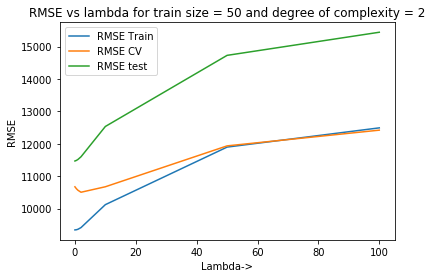

In [22]:
plt.figure()
plt.plot(data2_50["Lambda"],data2_50["RMSE Train"],label="RMSE Train")
plt.plot(data2_50["Lambda"],data2_50["RMSE CV"],label="RMSE CV")
plt.plot(data2_50["Lambda"],data2_50["RMSE test"],label="RMSE test")
plt.xlabel("Lambda->")
plt.ylabel("RMSE")
plt.legend()
plt.title("RMSE vs lambda for train size = 50 and degree of complexity = 2")
plt.savefig("d2_50.png")
plt.show()


### Surface plots for various values of lambda:

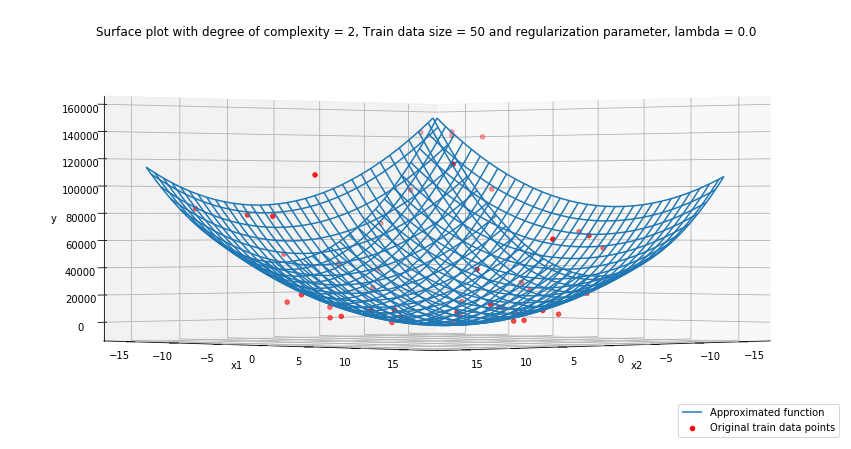

<Figure size 432x288 with 0 Axes>

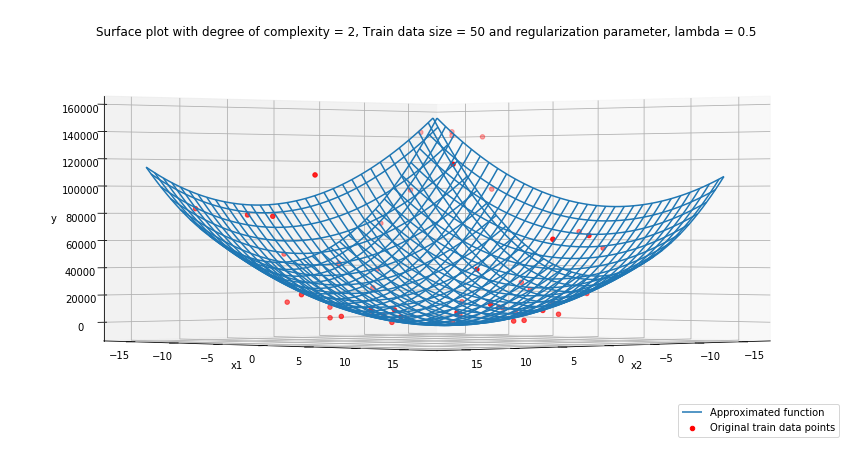

<Figure size 432x288 with 0 Axes>

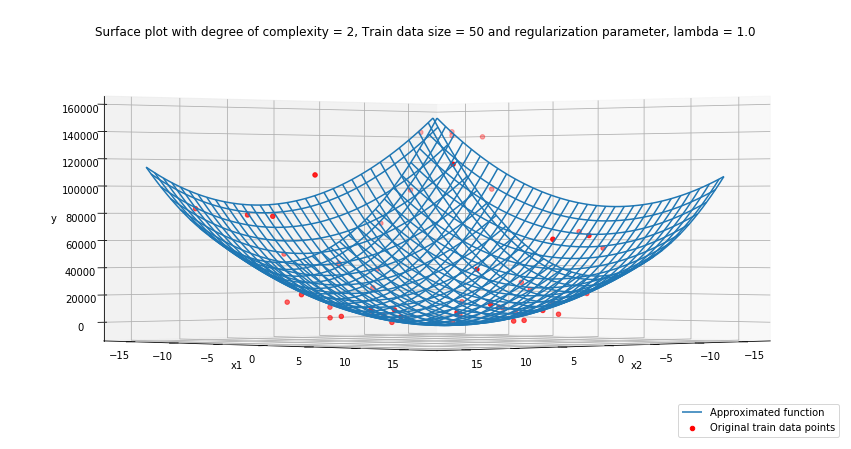

<Figure size 432x288 with 0 Axes>

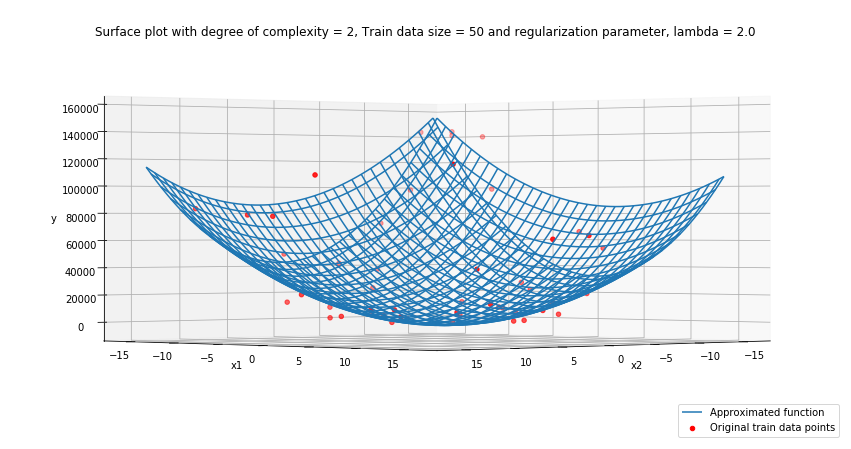

<Figure size 432x288 with 0 Axes>

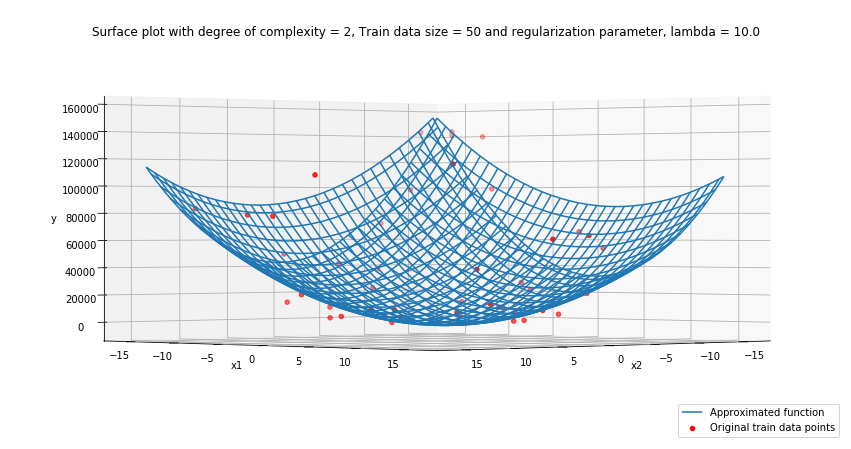

<Figure size 432x288 with 0 Axes>

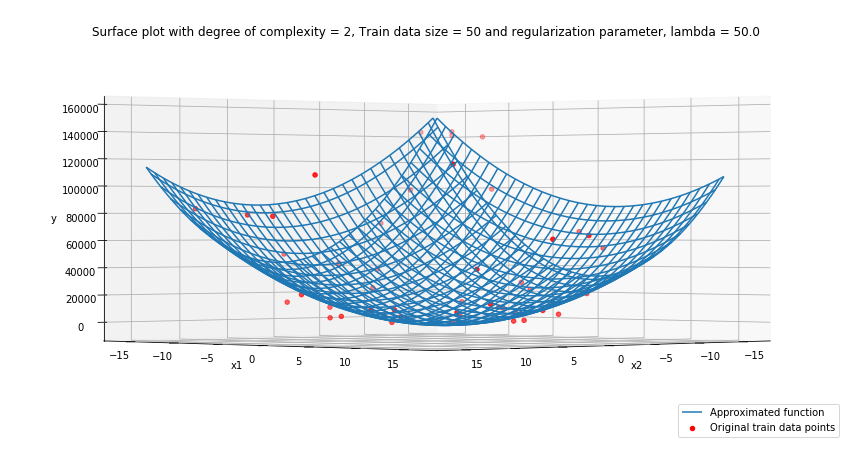

<Figure size 432x288 with 0 Axes>

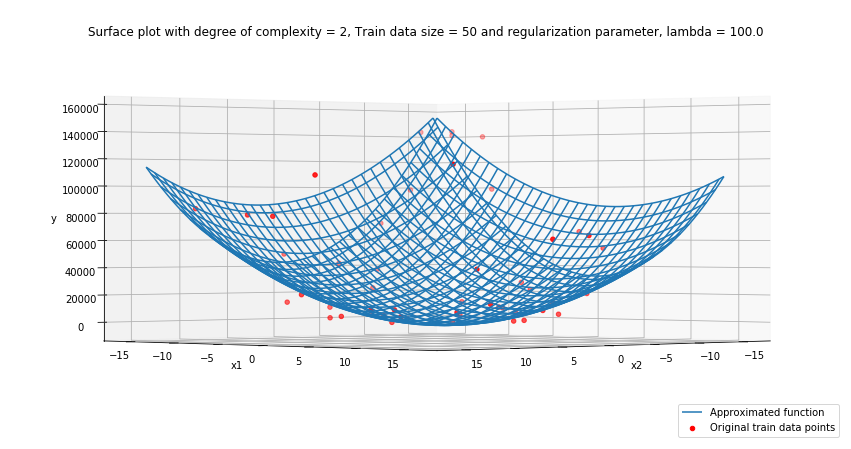

<Figure size 432x288 with 0 Axes>

In [42]:
for l in lambda_list:
    plot_approxY(2, w_2_50,y2_train50,y2_trainpred50[l],50,l,x12_train50,x22_train50)
    plt.savefig("surfaceplotsd2.png")

## 2.6 Predicting for degree of complexity = 2 and train data size = 200

In [43]:
data2_train200,data2_cv200,data2_test200=create_datasets(func2d,200,90)

In [44]:
x12_train200,x22_train200,y2_train200,x12_cv200,x22_cv200,y2_cv200,x12_test200,x22_test200,y2_test200=split_cols(data2_train200,data2_cv200,data2_test200)

In [45]:
### design matrix:
phi2_train200=create_phi(2,len(y2_train200),x12_train200,x22_train200)
phi2_cv200=create_phi(2,len(y2_cv200),x12_cv200,x22_cv200)
phi2_test200=create_phi(2,len(y2_test200),x12_test200,x22_test200)

In [46]:
y2_testpred200={}
y2_trainpred200={}
y2_cvpred200={}
lambda_list=[0,0.5,1,2,10,50,100]
rmse2_train200=[]
rmse2_test200=[]
rmse2_cv200=[]

In [47]:
for l in lambda_list:
    w_2_200=opt_regularized_param(l,phi2_train200,y2_train200);
    y2_trainpred200[l]=y_pred(phi2_train200,w_2_200)
    y2_testpred200[l]=y_pred(phi2_test200,w_2_200);
    y2_cvpred200[l]=y_pred(phi2_cv200,w_2_200);
    rmse2_train200.append(RMSE(y2_trainpred200[l],y2_train200))
    rmse2_test200.append(RMSE(y2_testpred200[l],y2_test200))
    rmse2_cv200.append(RMSE(y2_cvpred200[l],y2_cv200))
    

In [48]:
data2_200=pd.DataFrame(list(zip(lambda_list,rmse2_train200,rmse2_cv200,rmse2_test200)),columns=["Lambda", "RMSE Train","RMSE CV","RMSE test"])

In [49]:
data2_200

,Lambda,RMSE Train,RMSE CV,RMSE test
0,0.0,10603.192435,11441.785901,11150.939886
1,0.5,10603.415845,11446.904550,11156.825215
2,1.0,10604.071374,11452.289926,11163.038130
3,2.0,10606.594668,11463.799393,11176.371465
4,10.0,10669.635314,11580.332618,11313.117001
5,50.0,11255.483425,12231.138176,12083.245170
6,100.0,11803.891208,12766.946818,12714.396211


In [54]:
data2_200.to_csv("RMSE-lambda for complexity = 2 and train size = 200")

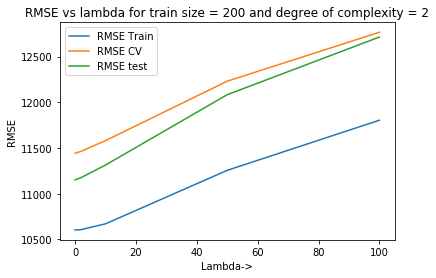

In [53]:
plt.figure()
plt.plot(data2_200["Lambda"],data2_200["RMSE Train"],label="RMSE Train")
plt.plot(data2_200["Lambda"],data2_200["RMSE CV"],label="RMSE CV")
plt.plot(data2_200["Lambda"],data2_200["RMSE test"],label="RMSE test")
plt.xlabel("Lambda->")
plt.ylabel("RMSE")
plt.legend()
plt.title("RMSE vs lambda for train size = 200 and degree of complexity = 2")
plt.savefig("d2_200.png")
plt.show()

### Surface plots for various values of lambda:

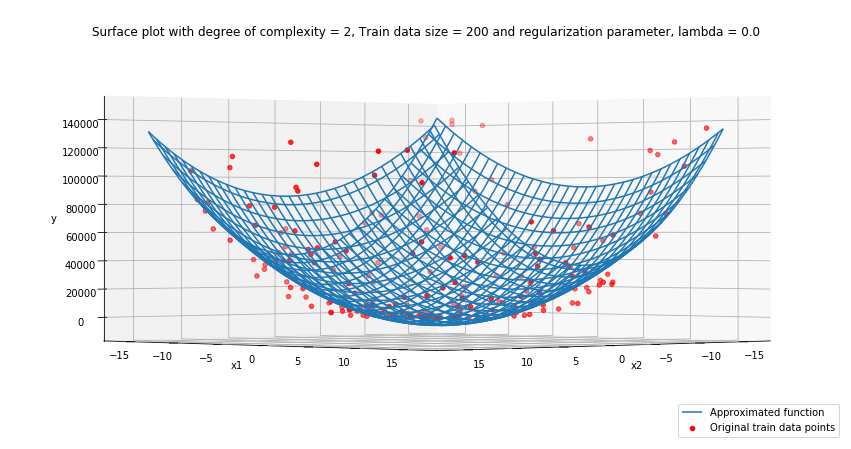

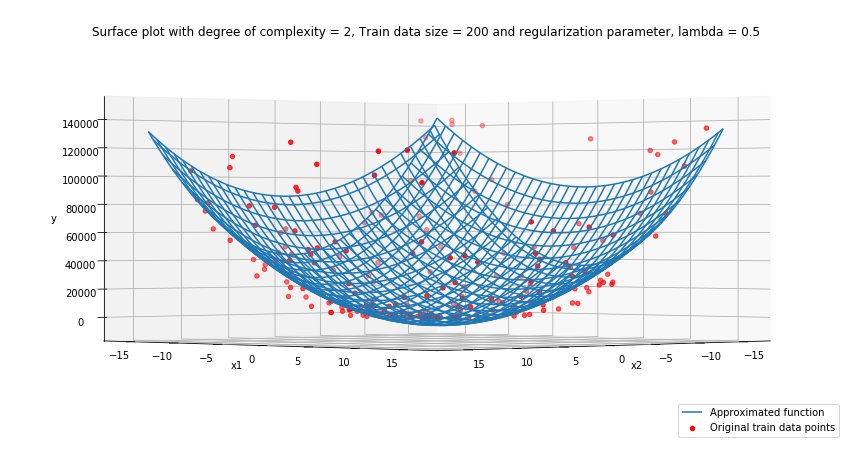

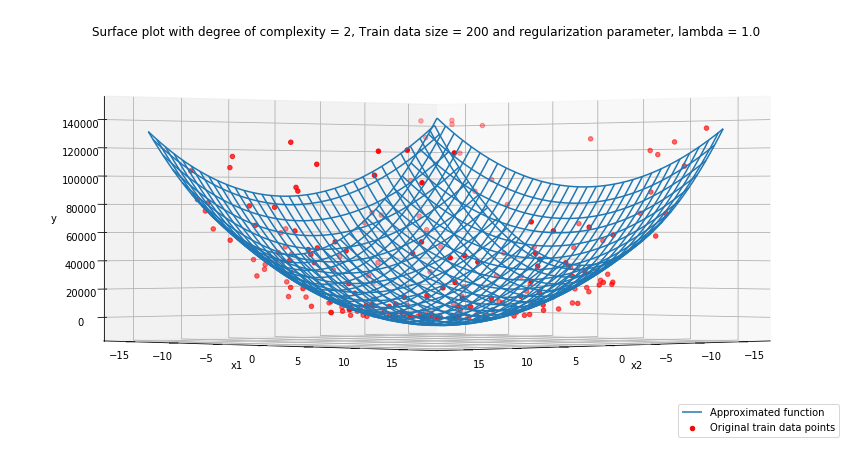

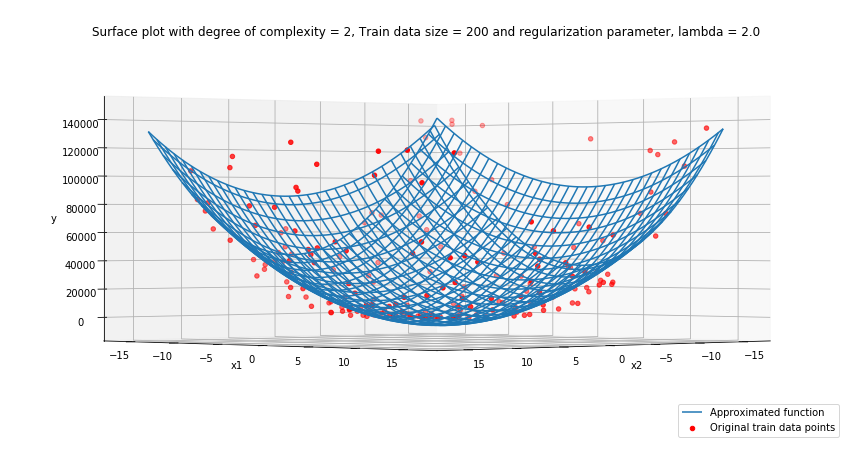

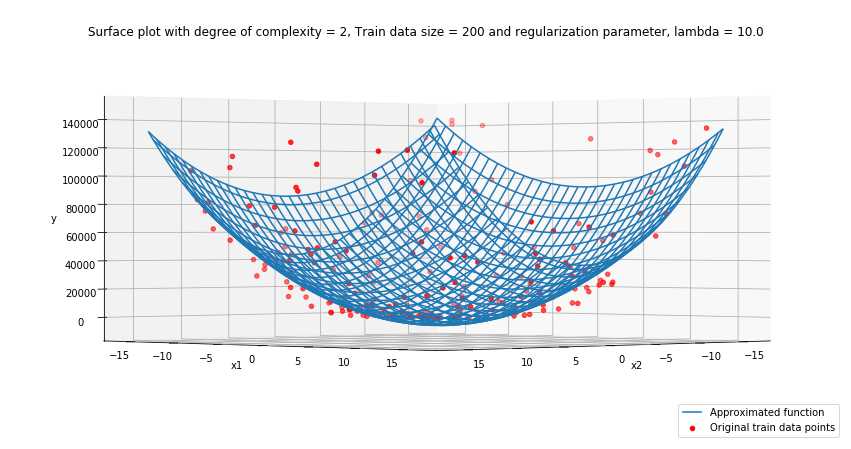

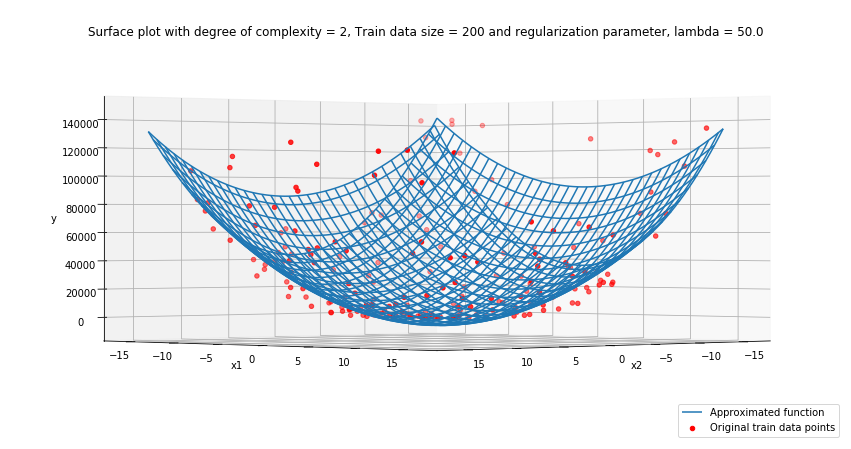

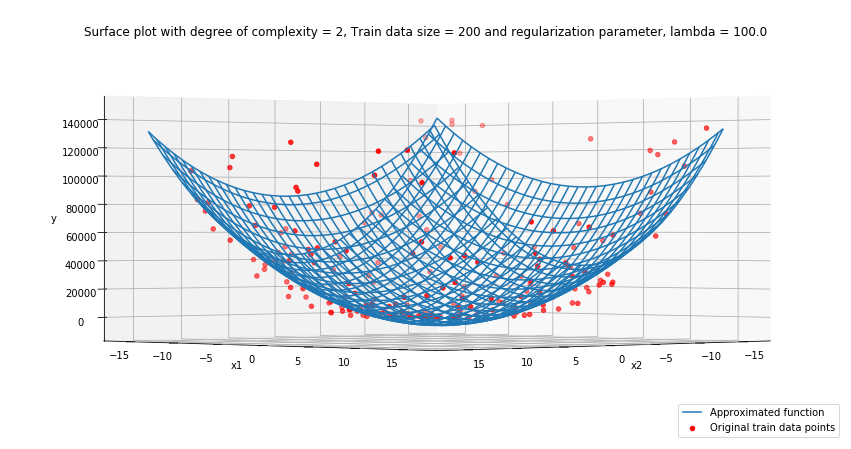

In [51]:
for l in lambda_list:
    plot_approxY(2, w_2_200,y2_train200,y2_trainpred200[l],200,l,x12_train200,x22_train200)

## 2.7 Predicting for degree of complexity = 2 and train data size = 500

In [55]:
data2_train500,data2_cv500,data2_test500=create_datasets(func2d,500,200)
x12_train500,x22_train500,y2_train500,x12_cv500,x22_cv500,y2_cv500,x12_test500,x22_test500,y2_test500=split_cols(data2_train500,data2_cv500,data2_test500)

### design matrix:
phi2_train500=create_phi(2,len(y2_train500),x12_train500,x22_train500)
phi2_cv500=create_phi(2,len(y2_cv500),x12_cv500,x22_cv500)
phi2_test500=create_phi(2,len(y2_test500),x12_test500,x22_test500)

y2_testpred500={}
y2_trainpred500={}
y2_cvpred500={}
lambda_list=[0,0.5,1,2,10,50,100]
rmse2_train500=[]
rmse2_test500=[]
rmse2_cv500=[]

for l in lambda_list:
    w_2_500=opt_regularized_param(l,phi2_train500,y2_train500);
    y2_trainpred500[l]=y_pred(phi2_train500,w_2_500)
    y2_testpred500[l]=y_pred(phi2_test500,w_2_500);
    y2_cvpred500[l]=y_pred(phi2_cv500,w_2_500);
    rmse2_train500.append(RMSE(y2_trainpred500[l],y2_train500))
    rmse2_test500.append(RMSE(y2_testpred500[l],y2_test500))
    rmse2_cv500.append(RMSE(y2_cvpred500[l],y2_cv500))
    

In [56]:
data2_500=pd.DataFrame(list(zip(lambda_list,rmse2_train500,rmse2_cv500,rmse2_test500)),columns=["Lambda", "RMSE Train","RMSE CV","RMSE test"])

In [57]:
data2_500

,Lambda,RMSE Train,RMSE CV,RMSE test
0,0.0,11357.118228,11273.367883,10866.525918
1,0.5,11357.156138,11275.713291,10867.722653
2,1.0,11357.268854,11278.120263,10868.991019
3,2.0,11357.712756,11283.113205,10871.736534
4,10.0,11370.513956,11330.472661,10902.457006
5,50.0,11568.948678,11661.303484,11176.169901
6,100.0,11890.601750,12086.197560,11563.185551


In [58]:
data2_500.to_csv("RMSE-lambda for complexity =2 train size =500")

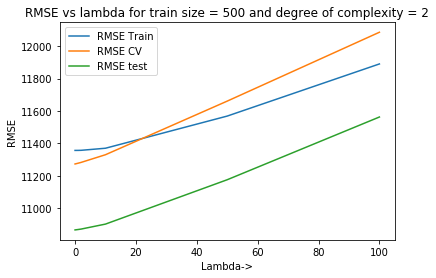

In [61]:
plt.figure()
plt.plot(data2_500["Lambda"],data2_500["RMSE Train"],label="RMSE Train")
plt.plot(data2_500["Lambda"],data2_500["RMSE CV"],label="RMSE CV")
plt.plot(data2_500["Lambda"],data2_500["RMSE test"],label="RMSE test")
plt.xlabel("Lambda->")
plt.ylabel("RMSE")
plt.legend()
plt.title("RMSE vs lambda for train size = 500 and degree of complexity = 2")
plt.savefig("d2_500.png")
plt.show()

### Surface plots for various values of lambda:

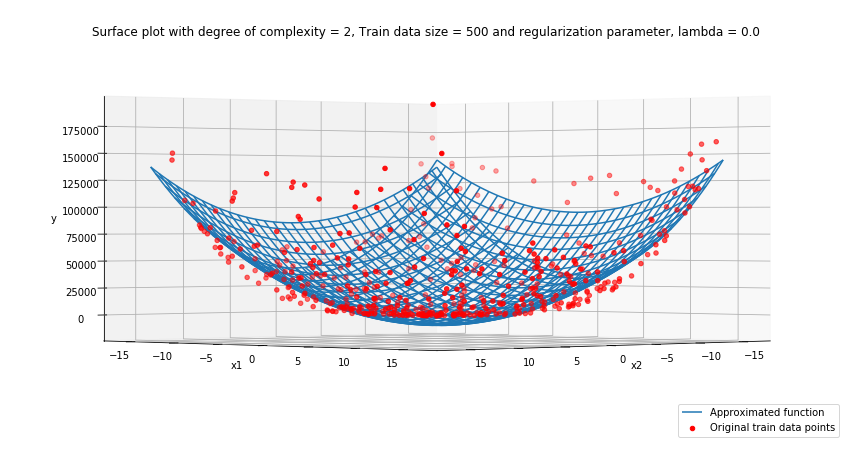

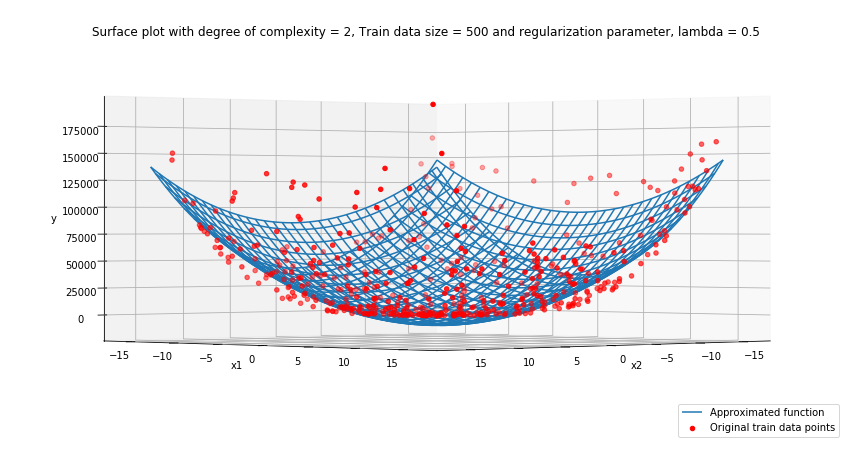

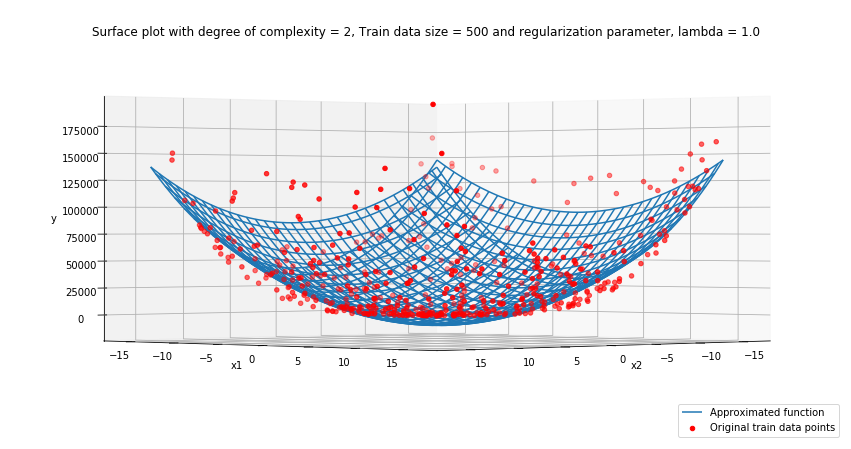

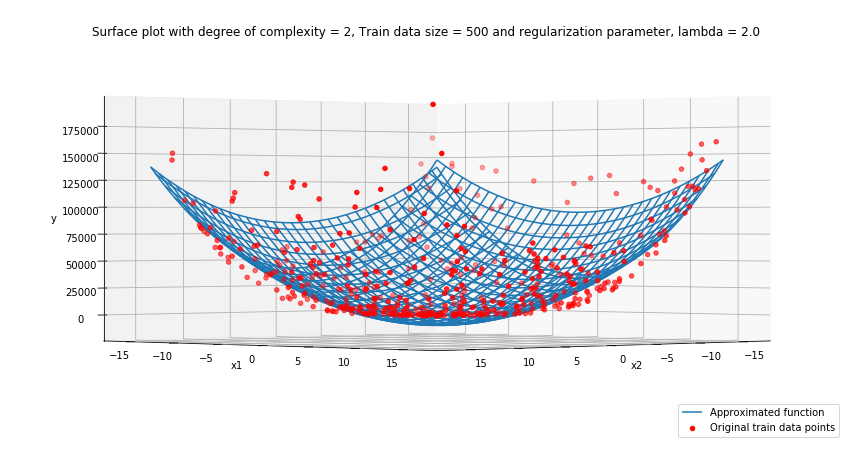

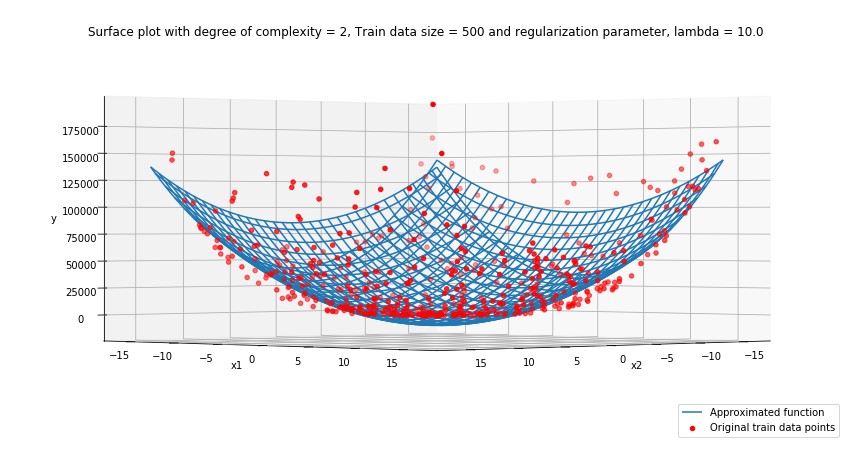

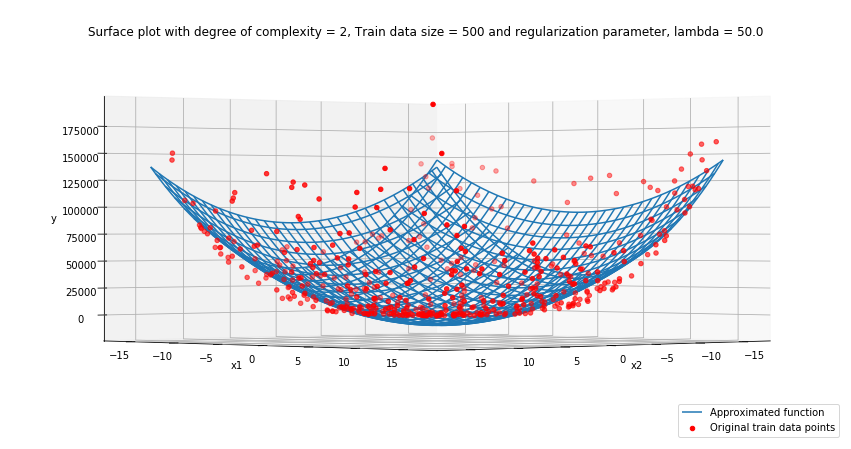

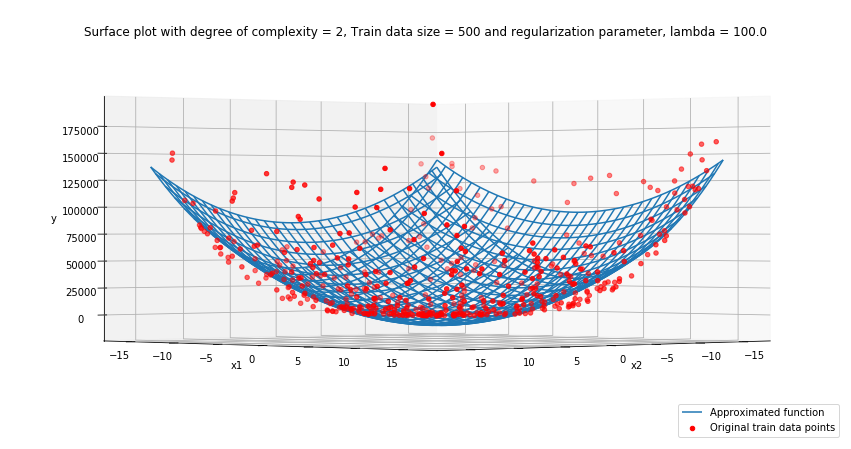

In [60]:
for l in lambda_list:
    plot_approxY(2, w_2_500,y2_train500,y2_trainpred500[l],500,l,x12_train500,x22_train500)

## 2.8 For train size =50 and degree of complexity = 3

In [62]:
data3_train50,data3_cv50,data3_test50=create_datasets(func2d,50,30)
x13_train50,x23_train50,y3_train50,x13_cv50,x23_cv50,y3_cv50,x13_test50,x23_test50,y3_test50=split_cols(data3_train50,data3_cv50,data3_test50)

### design matrix:
phi3_train50=create_phi(3,len(y3_train50),x13_train50,x23_train50)
phi3_cv50=create_phi(3,len(y3_cv50),x13_cv50,x23_cv50)
phi3_test50=create_phi(3,len(y3_test50),x13_test50,x23_test50)

y3_testpred50={}
y3_trainpred50={}
y3_cvpred50={}
lambda_list=[0,0.5,1,2,10,50,100]
rmse3_train50=[]
rmse3_test50=[]
rmse3_cv50=[]

for l in lambda_list:
    w_3_50=opt_regularized_param(l,phi3_train50,y3_train50);
    y3_trainpred50[l]=y_pred(phi3_train50,w_3_50)
    y3_testpred50[l]=y_pred(phi3_test50,w_3_50);
    y3_cvpred50[l]=y_pred(phi3_cv50,w_3_50);
    rmse3_train50.append(RMSE(y3_trainpred50[l],y3_train50))
    rmse3_test50.append(RMSE(y3_testpred50[l],y3_test50))
    rmse3_cv50.append(RMSE(y3_cvpred50[l],y3_cv50))
    

In [63]:
data3_50=pd.DataFrame(list(zip(lambda_list,rmse3_train50,rmse3_cv50,rmse3_test50)),columns=["Lambda", "RMSE Train","RMSE CV","RMSE test"])

In [64]:
data3_50.to_csv("rmse lambda for complexity = 3 train sie =50")

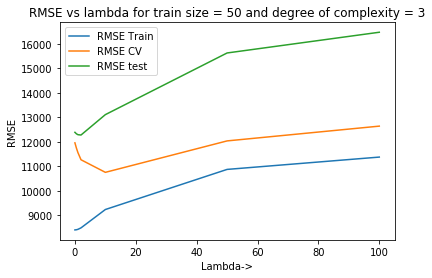

In [65]:
plt.figure()
plt.plot(data3_50["Lambda"],data3_50["RMSE Train"],label="RMSE Train")
plt.plot(data3_50["Lambda"],data3_50["RMSE CV"],label="RMSE CV")
plt.plot(data3_50["Lambda"],data3_50["RMSE test"],label="RMSE test")
plt.xlabel("Lambda->")
plt.ylabel("RMSE")
plt.legend()
plt.title("RMSE vs lambda for train size = 50 and degree of complexity = 3")
plt.savefig("d3_50.png")
plt.show()

### Surface plots for various values of lambda

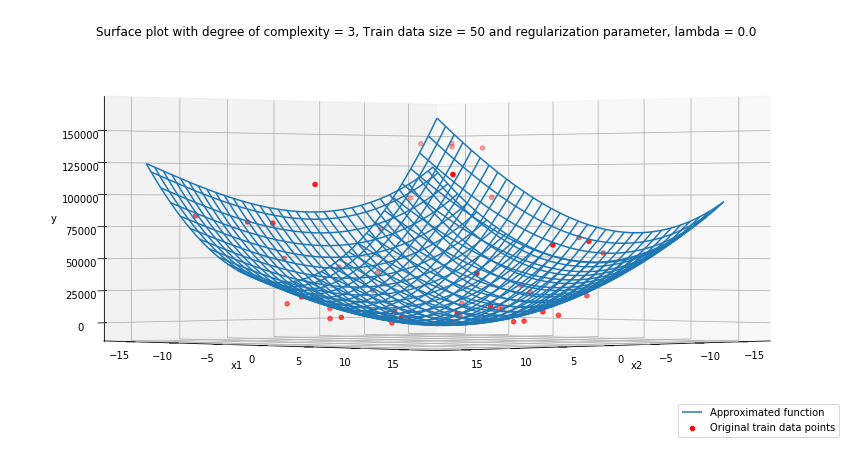

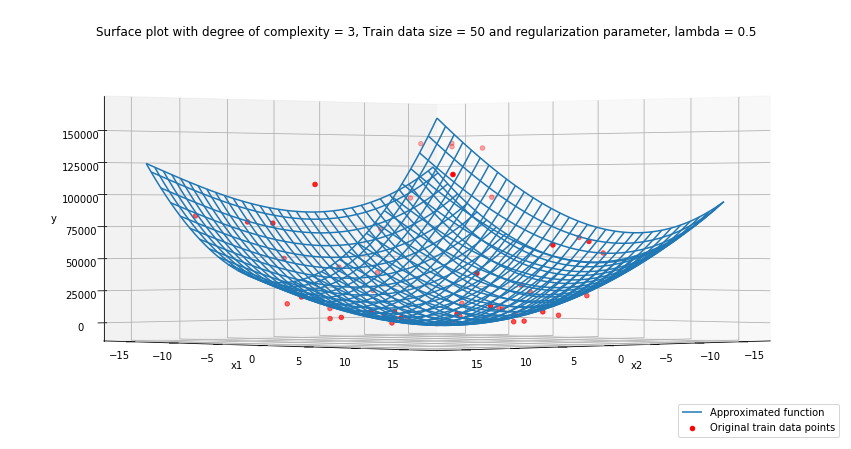

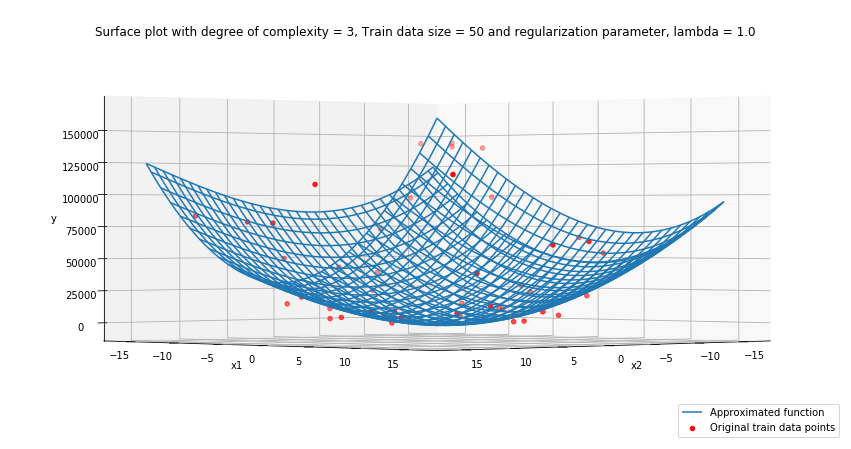

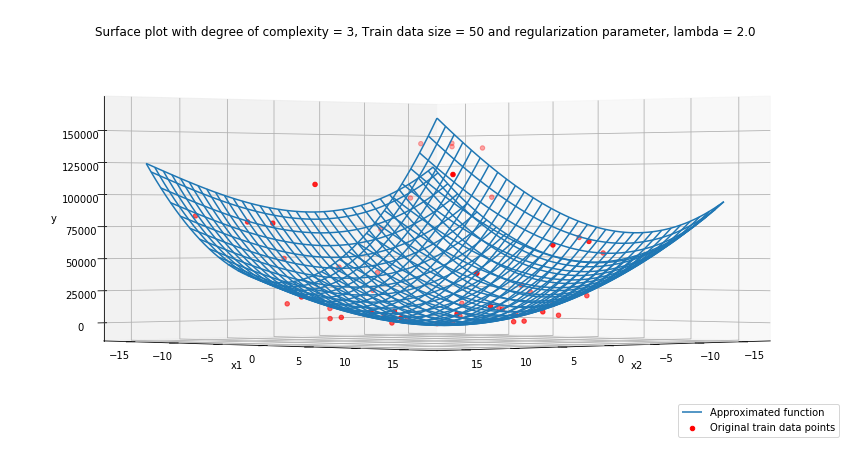

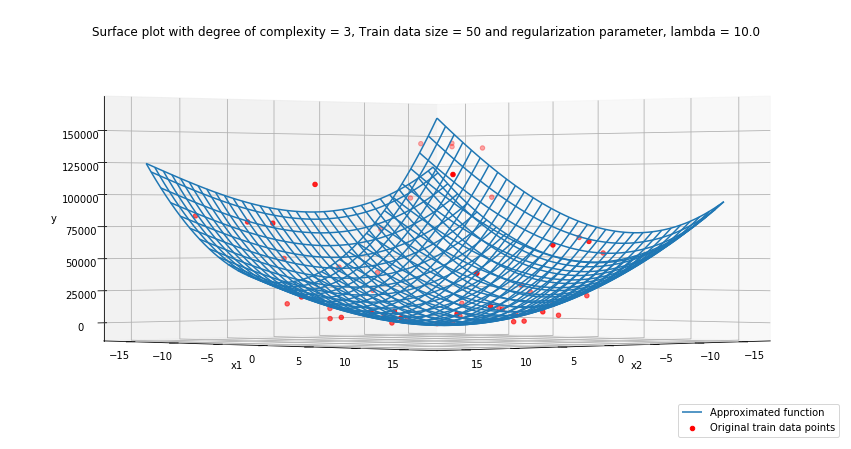

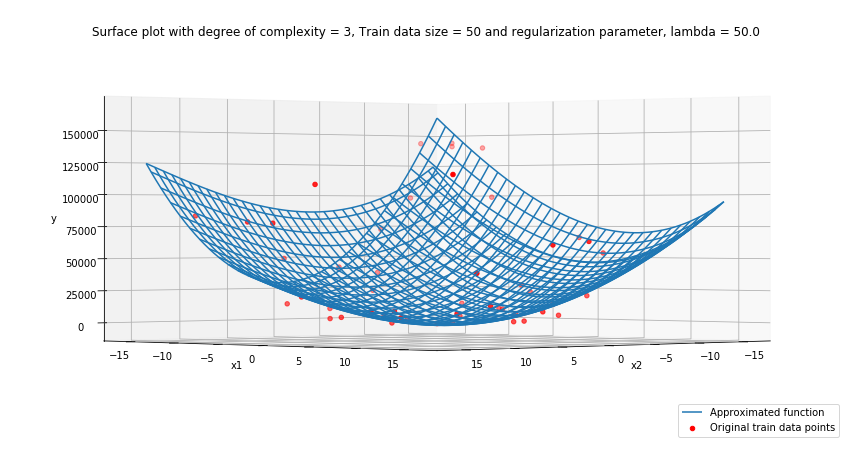

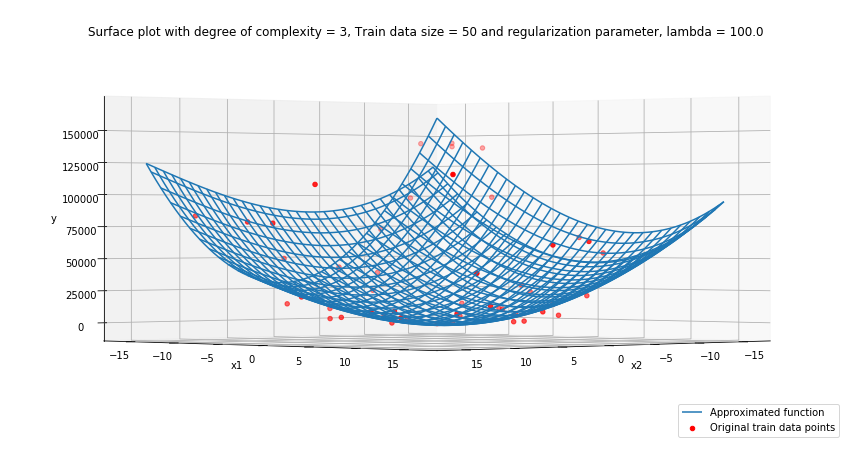

In [66]:
for l in lambda_list:
    plot_approxY(3, w_3_50,y3_train50,y3_trainpred50[l],50,l,x13_train50,x23_train50)

## 2.9 For train size = 200 and degree of complexity = 3:

In [67]:
data3_train200,data3_cv200,data3_test200=create_datasets(func2d,200,90)
x13_train200,x23_train200,y3_train200,x13_cv200,x23_cv200,y3_cv200,x13_test200,x23_test200,y3_test200=split_cols(data3_train200,data3_cv200,data3_test200)

### design matrix:
phi3_train200=create_phi(3,len(y3_train200),x13_train200,x23_train200)
phi3_cv200=create_phi(3,len(y3_cv200),x13_cv200,x23_cv200)
phi3_test200=create_phi(3,len(y3_test200),x13_test200,x23_test200)

y3_testpred200={}
y3_trainpred200={}
y3_cvpred200={}
lambda_list=[0,0.5,1,2,10,50,100]
rmse3_train200=[]
rmse3_test200=[]
rmse3_cv200=[]

for l in lambda_list:
    w_3_200=opt_regularized_param(l,phi3_train200,y3_train200);
    y3_trainpred200[l]=y_pred(phi3_train200,w_3_200)
    y3_testpred200[l]=y_pred(phi3_test200,w_3_200);
    y3_cvpred200[l]=y_pred(phi3_cv200,w_3_200);
    rmse3_train200.append(RMSE(y3_trainpred200[l],y3_train200))
    rmse3_test200.append(RMSE(y3_testpred200[l],y3_test200))
    rmse3_cv200.append(RMSE(y3_cvpred200[l],y3_cv200))
    

In [68]:
data3_200=pd.DataFrame(list(zip(lambda_list,rmse3_train200,rmse3_cv200,rmse3_test200)),columns=["Lambda", "RMSE Train","RMSE CV","RMSE test"])

In [77]:
data3_200.to_csv("rmse lambda for complexity = 3, train size = 200")


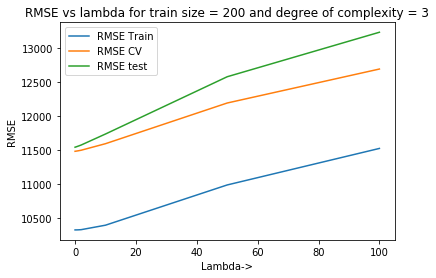

In [76]:
plt.figure()
plt.plot(data3_200["Lambda"],data3_200["RMSE Train"],label="RMSE Train")
plt.plot(data3_200["Lambda"],data3_200["RMSE CV"],label="RMSE CV")
plt.plot(data3_200["Lambda"],data3_200["RMSE test"],label="RMSE test")
plt.xlabel("Lambda->")
plt.ylabel("RMSE")
plt.legend()
plt.title("RMSE vs lambda for train size = 200 and degree of complexity = 3")
plt.savefig("d3_200.png")
plt.show()

### Surface Plots fror various values of lambda:

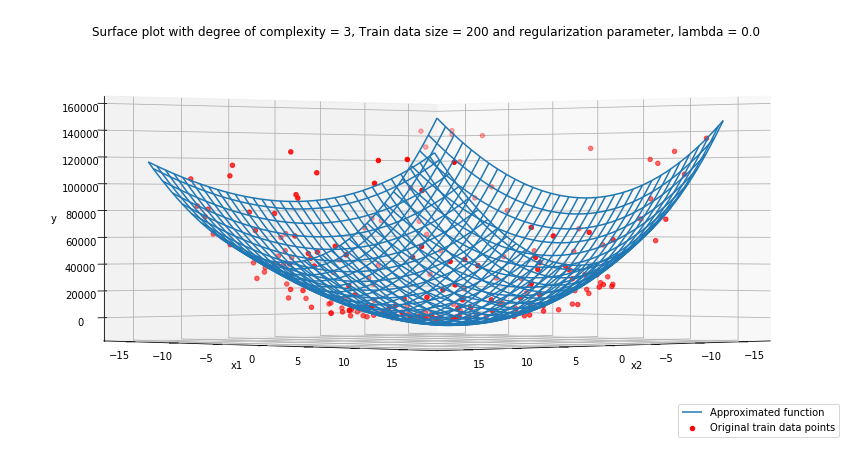

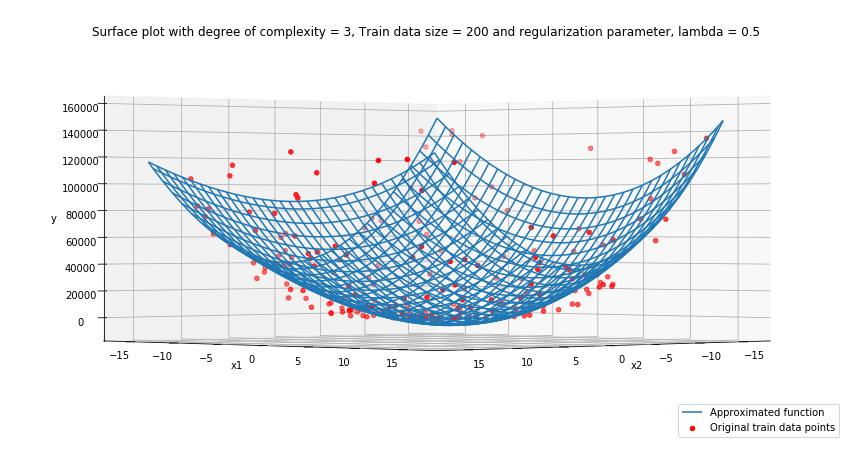

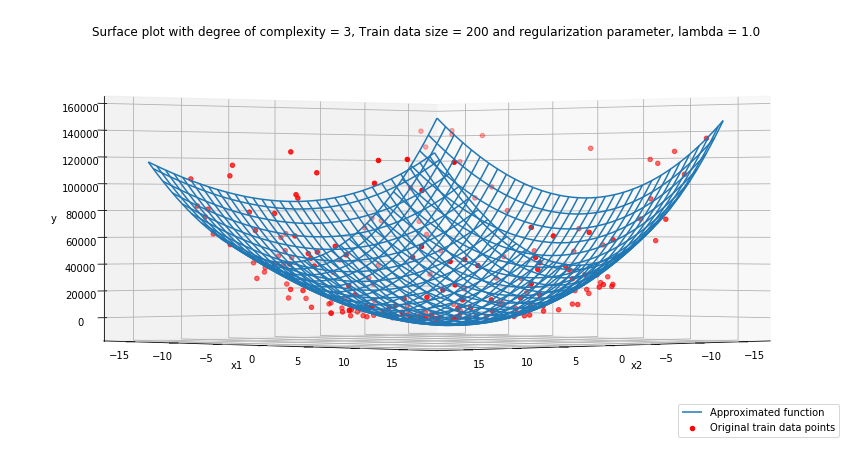

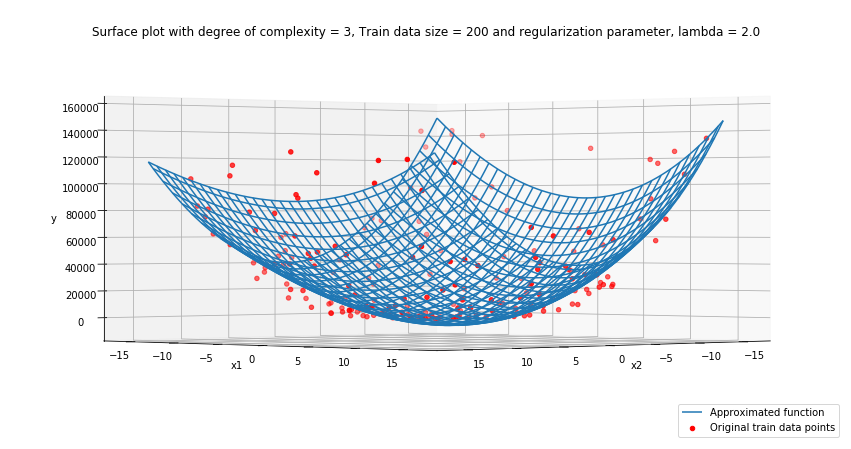

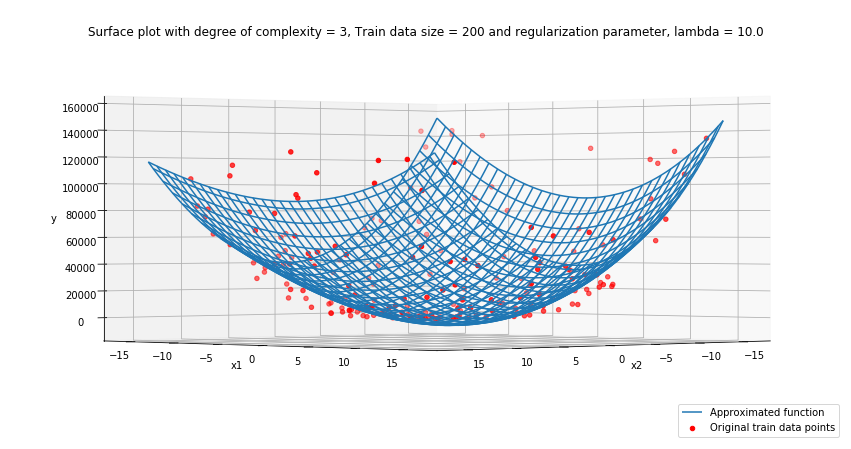

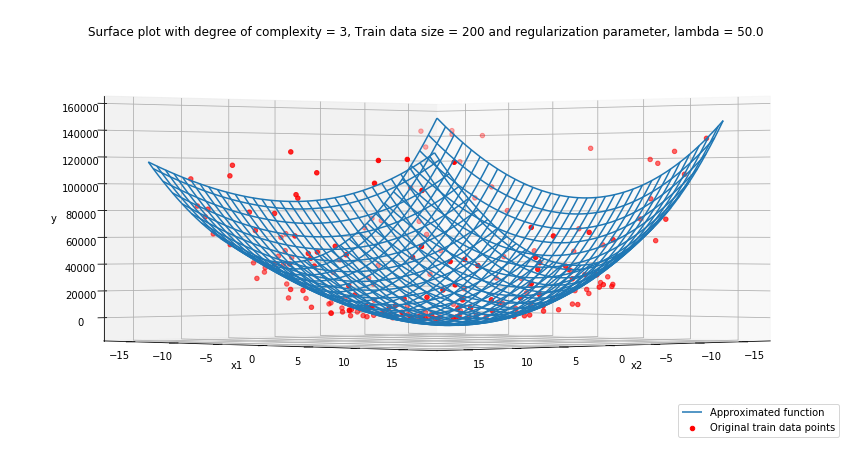

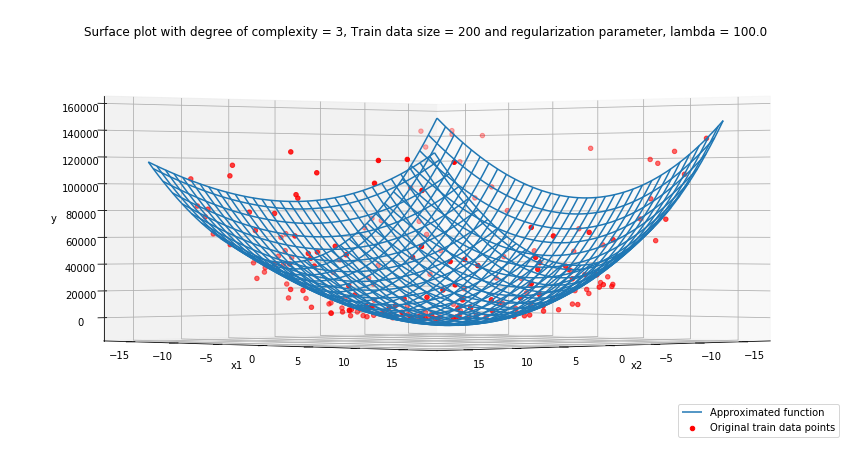

In [71]:
for l in lambda_list:
    plot_approxY(3, w_3_200,y3_train200,y3_trainpred200[l],200,l,x13_train200,x23_train200)

## 2.10 For train data size = 500 and degree of complexity = 3

In [72]:
data3_train500,data3_cv500,data3_test500=create_datasets(func2d,500,200)
x13_train500,x23_train500,y3_train500,x13_cv500,x23_cv500,y3_cv500,x13_test500,x23_test500,y3_test500=split_cols(data3_train500,data3_cv500,data3_test500)

### design matrix:
phi3_train500=create_phi(3,len(y3_train500),x13_train500,x23_train500)
phi3_cv500=create_phi(3,len(y3_cv500),x13_cv500,x23_cv500)
phi3_test500=create_phi(3,len(y3_test500),x13_test500,x23_test500)

y3_testpred500={}
y3_trainpred500={}
y3_cvpred500={}
lambda_list=[0,0.5,1,2,10,50,100]
rmse3_train500=[]
rmse3_test500=[]
rmse3_cv500=[]

for l in lambda_list:
    w_3_500=opt_regularized_param(l,phi3_train500,y3_train500);
    y3_trainpred500[l]=y_pred(phi3_train500,w_3_500)
    y3_testpred500[l]=y_pred(phi3_test500,w_3_500);
    y3_cvpred500[l]=y_pred(phi3_cv500,w_3_500);
    rmse3_train500.append(RMSE(y3_trainpred500[l],y3_train500))
    rmse3_test500.append(RMSE(y3_testpred500[l],y3_test500))
    rmse3_cv500.append(RMSE(y3_cvpred500[l],y3_cv500))
    

In [73]:
data3_500=pd.DataFrame(list(zip(lambda_list,rmse3_train500,rmse3_cv500,rmse3_test500)),columns=["Lambda", "RMSE Train","RMSE CV","RMSE test"])

In [75]:
data3_500.to_csv("rmse lambda for complexity = 3 train size = 500")

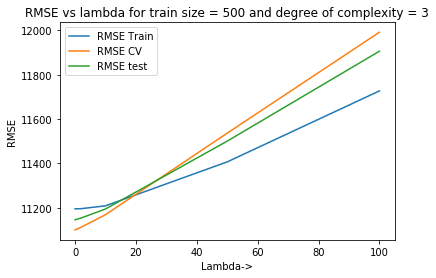

In [78]:
plt.figure()
plt.plot(data3_500["Lambda"],data3_500["RMSE Train"],label="RMSE Train")
plt.plot(data3_500["Lambda"],data3_500["RMSE CV"],label="RMSE CV")
plt.plot(data3_500["Lambda"],data3_500["RMSE test"],label="RMSE test")
plt.xlabel("Lambda->")
plt.ylabel("RMSE")
plt.legend()
plt.title("RMSE vs lambda for train size = 500 and degree of complexity = 3")
plt.savefig("d3_500.png")
plt.show()

### Surface Plots for various values of lambda:

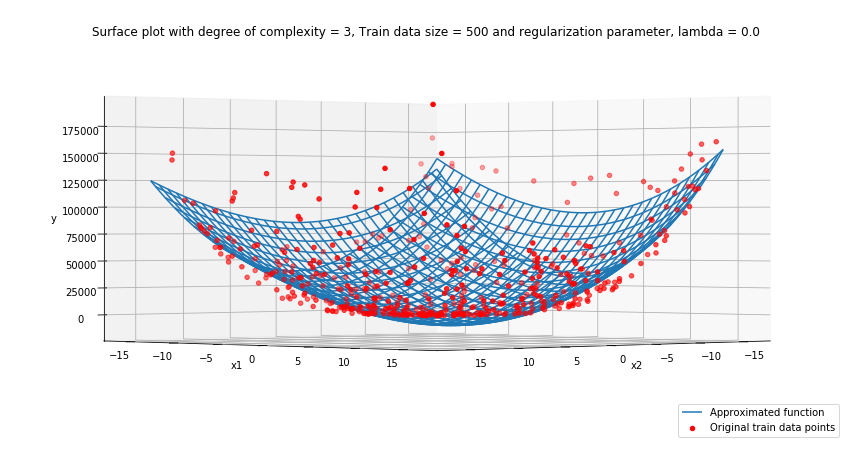

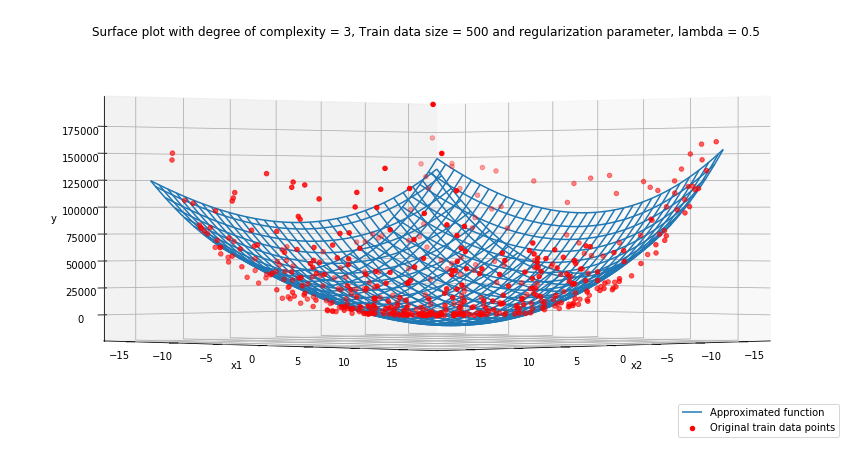

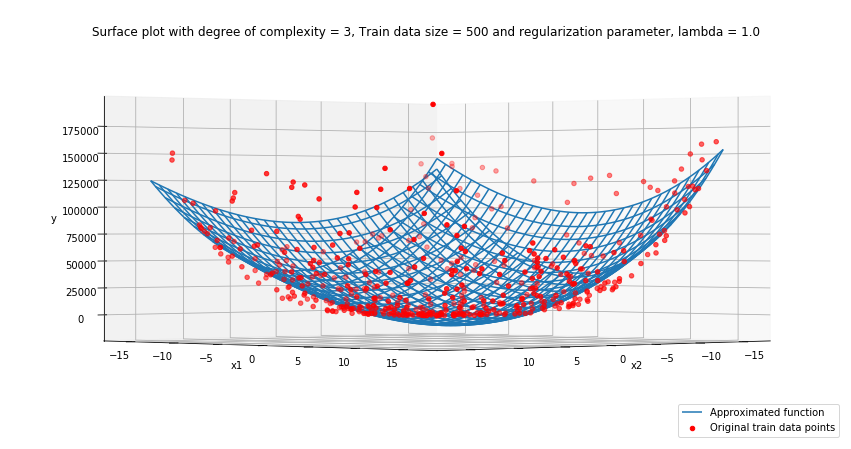

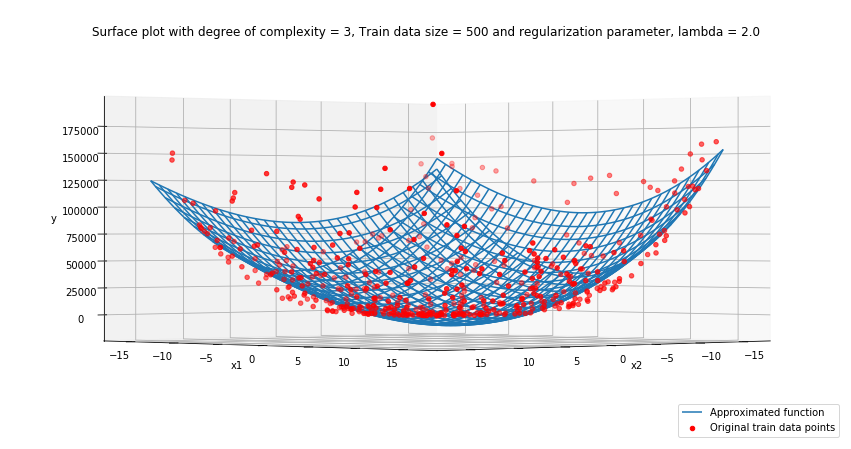

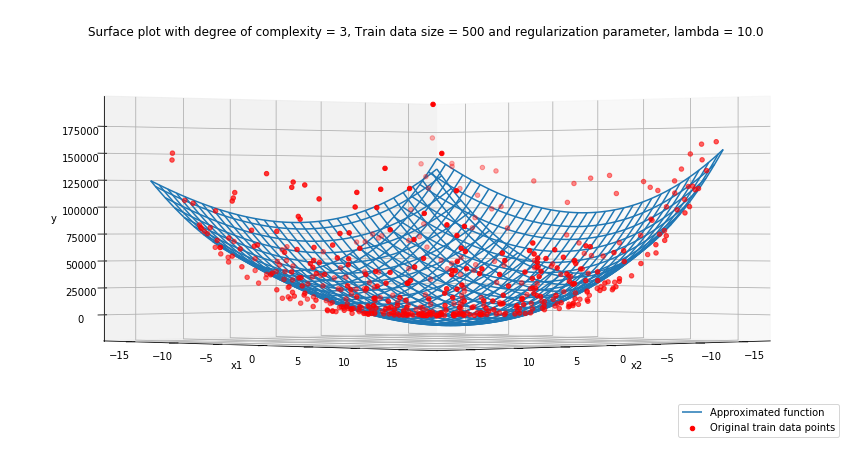

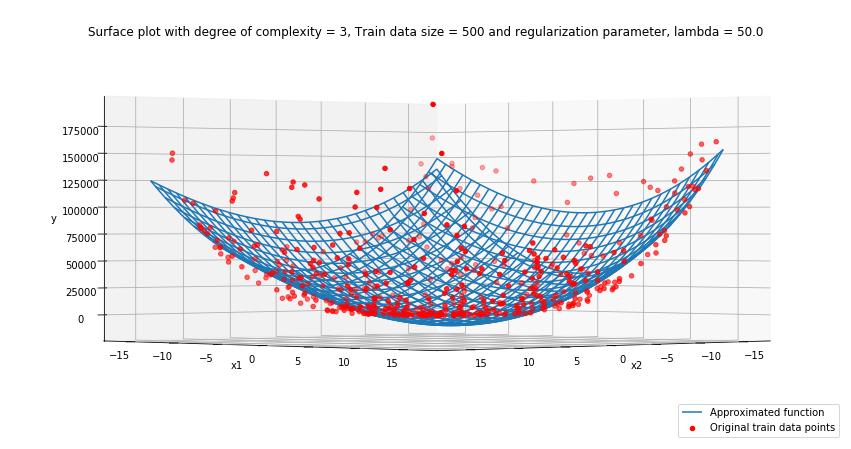

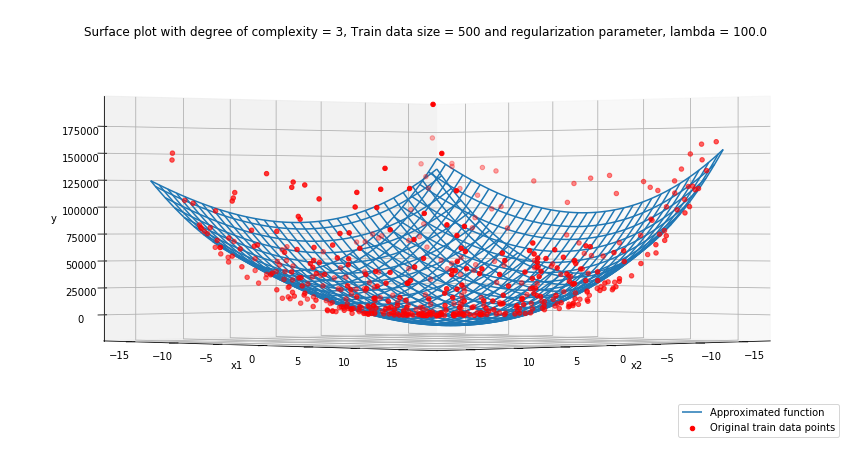

In [79]:
for l in lambda_list:
    plot_approxY(3, w_3_500,y3_train500,y3_trainpred500[l],500,l,x13_train500,x23_train500)

## 2.11 Degree of complexity = 6 and train data size = 50 

In [80]:
data6_train50,data6_cv50,data6_test50=create_datasets(func2d,50,30)
x16_train50,x26_train50,y6_train50,x16_cv50,x26_cv50,y6_cv50,x16_test50,x26_test50,y6_test50=split_cols(data6_train50,data6_cv50,data6_test50)

### design matrix:
phi6_train50=create_phi(6,len(y6_train50),x16_train50,x26_train50)
phi6_cv50=create_phi(6,len(y6_cv50),x16_cv50,x26_cv50)
phi6_test50=create_phi(6,len(y6_test50),x16_test50,x26_test50)

y6_testpred50={}
y6_trainpred50={}
y6_cvpred50={}
lambda_list=[0,0.5,1,2,10,50,100]
rmse6_train50=[]
rmse6_test50=[]
rmse6_cv50=[]

for l in lambda_list:
    w_6_50=opt_regularized_param(l,phi6_train50,y6_train50);
    y6_trainpred50[l]=y_pred(phi6_train50,w_6_50)
    y6_testpred50[l]=y_pred(phi6_test50,w_6_50);
    y6_cvpred50[l]=y_pred(phi6_cv50,w_6_50);
    rmse6_train50.append(RMSE(y6_trainpred50[l],y6_train50))
    rmse6_test50.append(RMSE(y6_testpred50[l],y6_test50))
    rmse6_cv50.append(RMSE(y6_cvpred50[l],y6_cv50))
    

In [81]:
data6_50=pd.DataFrame(list(zip(lambda_list,rmse6_train50,rmse6_cv50,rmse6_test50)),columns=["Lambda", "RMSE Train","RMSE CV","RMSE test"])

In [82]:
data6_50.to_csv("rmse lambda complexity= 6, train = 50")

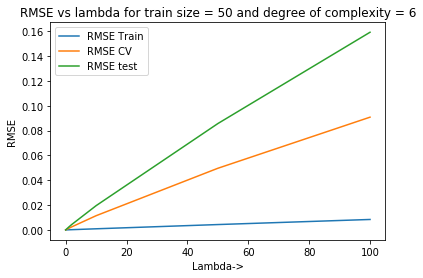

In [83]:
plt.figure()
plt.plot(data6_50["Lambda"],data6_50["RMSE Train"],label="RMSE Train")
plt.plot(data6_50["Lambda"],data6_50["RMSE CV"],label="RMSE CV")
plt.plot(data6_50["Lambda"],data6_50["RMSE test"],label="RMSE test")
plt.xlabel("Lambda->")
plt.ylabel("RMSE")
plt.legend()
plt.title("RMSE vs lambda for train size = 50 and degree of complexity = 6")
plt.savefig("d6_50.png")
plt.show()

### Surface plots for various values of lambda:

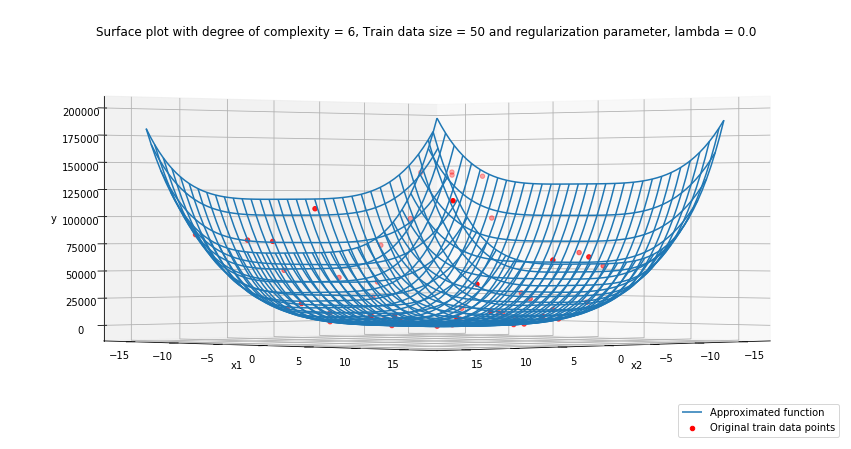

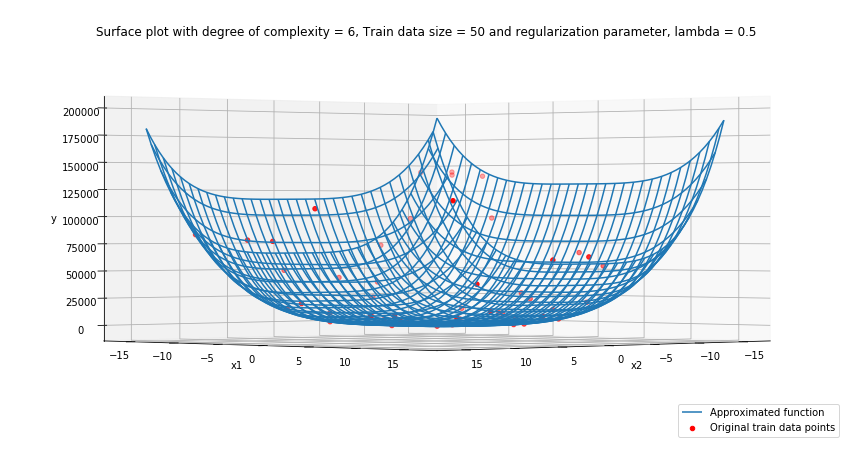

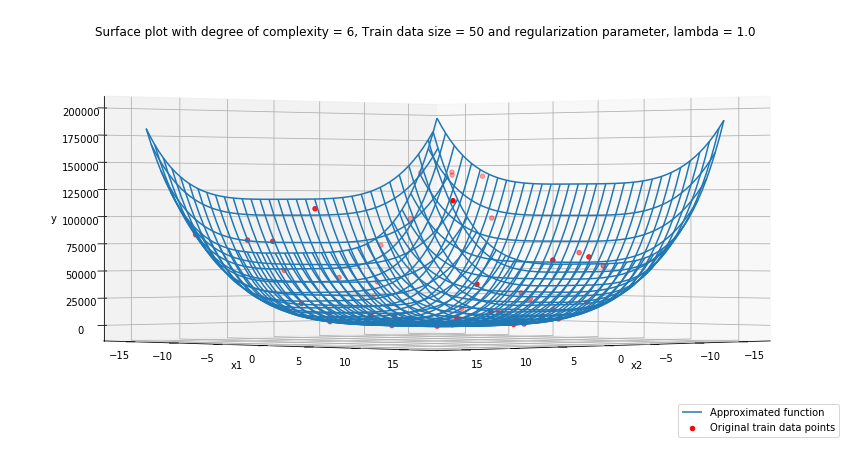

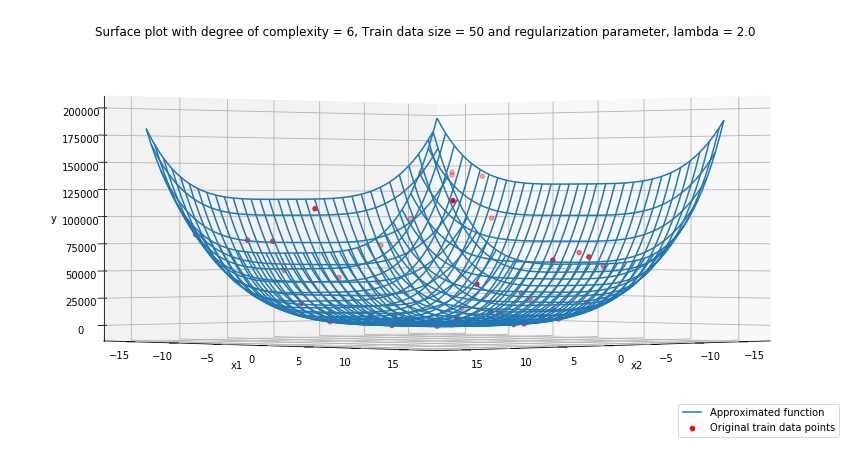

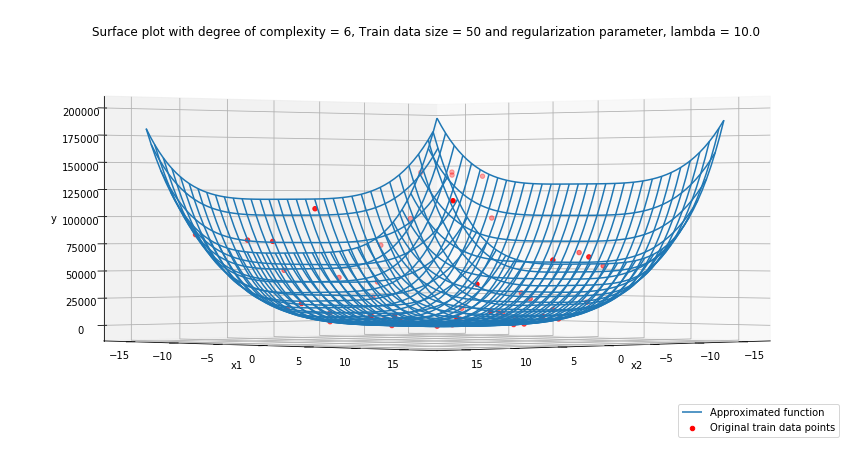

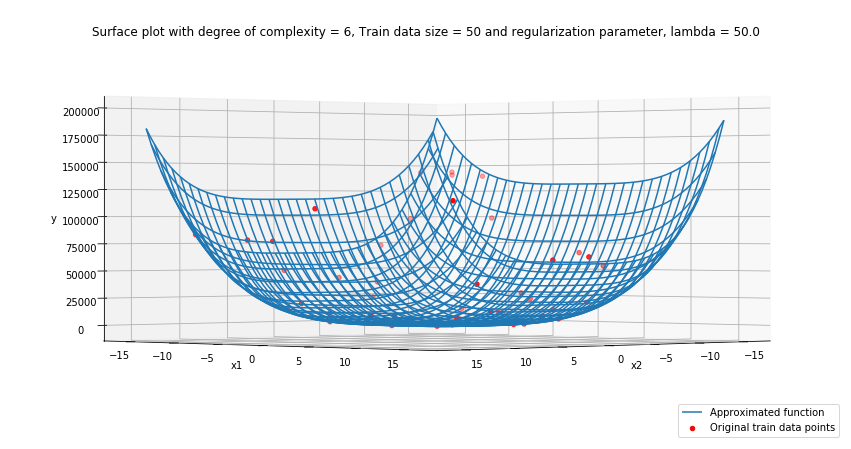

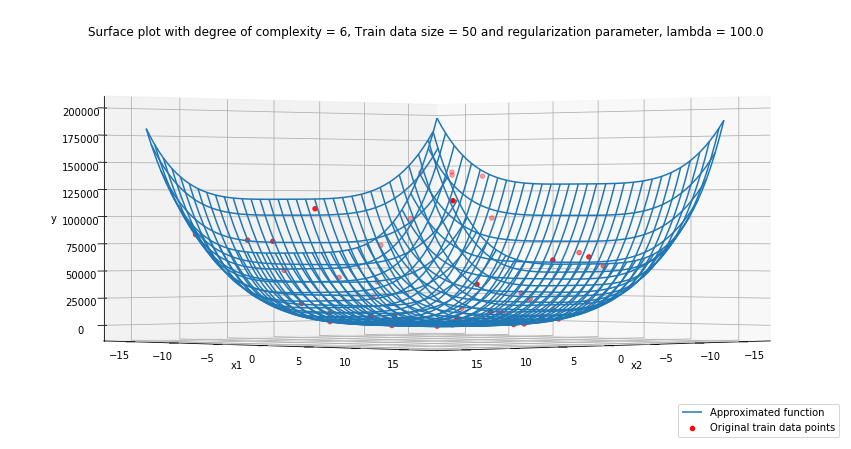

In [84]:
for l in lambda_list:
    plot_approxY(6, w_6_50,y6_train50,y6_trainpred50[l],50,l,x16_train50,x26_train50)

## 2.12 For degree of complexity = 6 and train data size = 200

In [85]:
data6_train200,data6_cv200,data6_test200=create_datasets(func2d,200,90)
x16_train200,x26_train200,y6_train200,x16_cv200,x26_cv200,y6_cv200,x16_test200,x26_test200,y6_test200=split_cols(data6_train200,data6_cv200,data6_test200)

### design matrix:
phi6_train200=create_phi(6,len(y6_train200),x16_train200,x26_train200)
phi6_cv200=create_phi(6,len(y6_cv200),x16_cv200,x26_cv200)
phi6_test200=create_phi(6,len(y6_test200),x16_test200,x26_test200)

y6_testpred200={}
y6_trainpred200={}
y6_cvpred200={}
lambda_list=[0,0.5,1,2,10,50,100]
rmse6_train200=[]
rmse6_test200=[]
rmse6_cv200=[]

for l in lambda_list:
    w_6_200=opt_regularized_param(l,phi6_train200,y6_train200);
    y6_trainpred200[l]=y_pred(phi6_train200,w_6_200)
    y6_testpred200[l]=y_pred(phi6_test200,w_6_200);
    y6_cvpred200[l]=y_pred(phi6_cv200,w_6_200);
    rmse6_train200.append(RMSE(y6_trainpred200[l],y6_train200))
    rmse6_test200.append(RMSE(y6_testpred200[l],y6_test200))
    rmse6_cv200.append(RMSE(y6_cvpred200[l],y6_cv200))
    

In [86]:
data6_200=pd.DataFrame(list(zip(lambda_list,rmse6_train200,rmse6_cv200,rmse6_test200)),columns=["Lambda", "RMSE Train","RMSE CV","RMSE test"])

In [87]:
data6_200.to_csv("rmse lambda complexity = 6 train = 200")

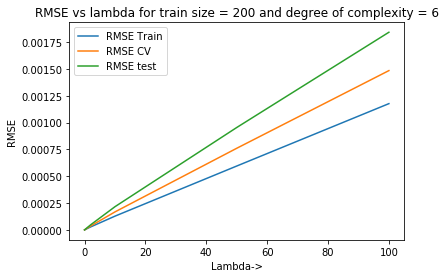

In [88]:
plt.figure()
plt.plot(data6_200["Lambda"],data6_200["RMSE Train"],label="RMSE Train")
plt.plot(data6_200["Lambda"],data6_200["RMSE CV"],label="RMSE CV")
plt.plot(data6_200["Lambda"],data6_200["RMSE test"],label="RMSE test")
plt.xlabel("Lambda->")
plt.ylabel("RMSE")
plt.legend()
plt.title("RMSE vs lambda for train size = 200 and degree of complexity = 6")
plt.savefig("d6_200.png")
plt.show()

### Surface plots for various values of lambda:

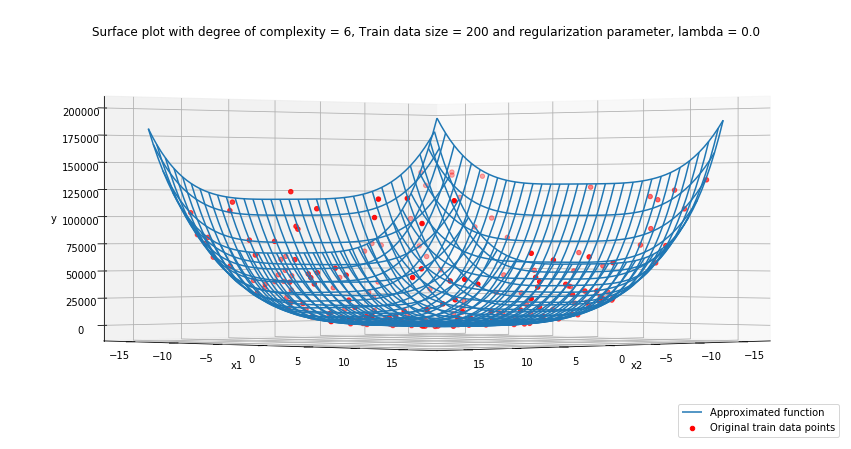

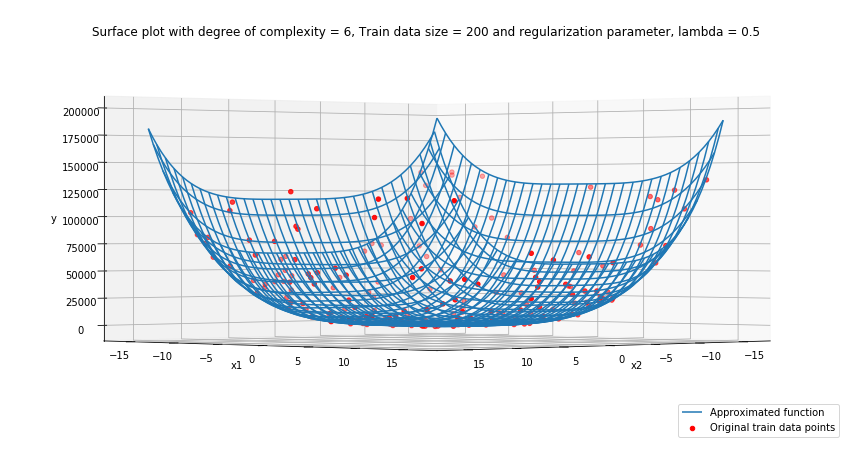

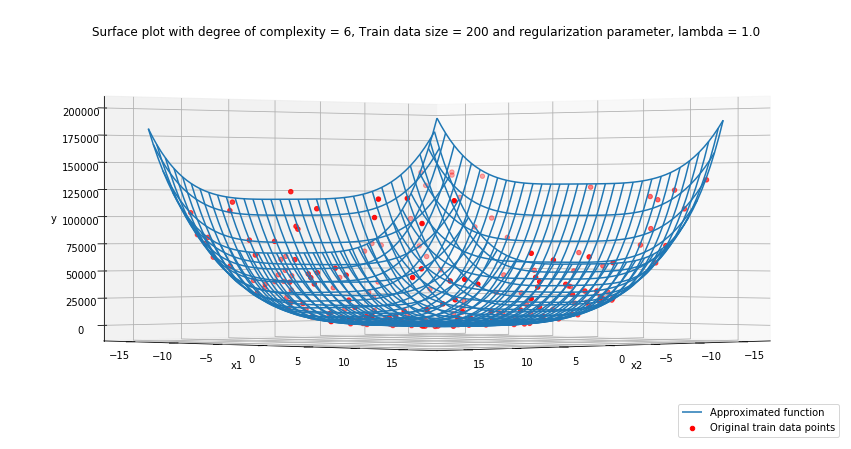

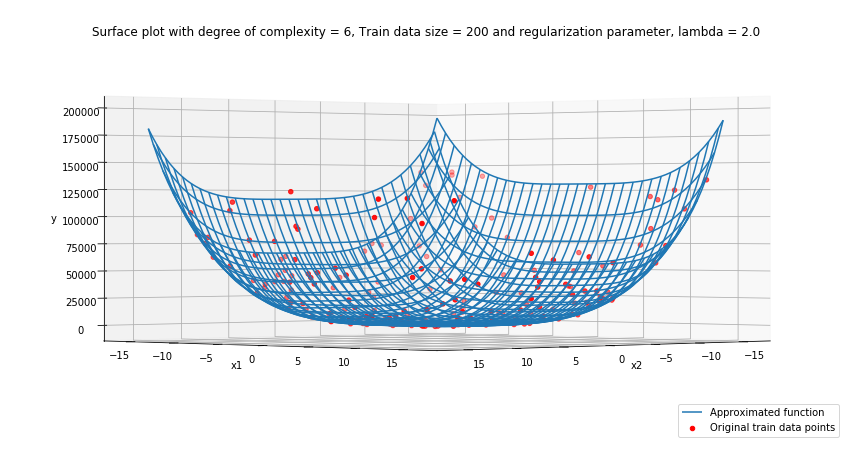

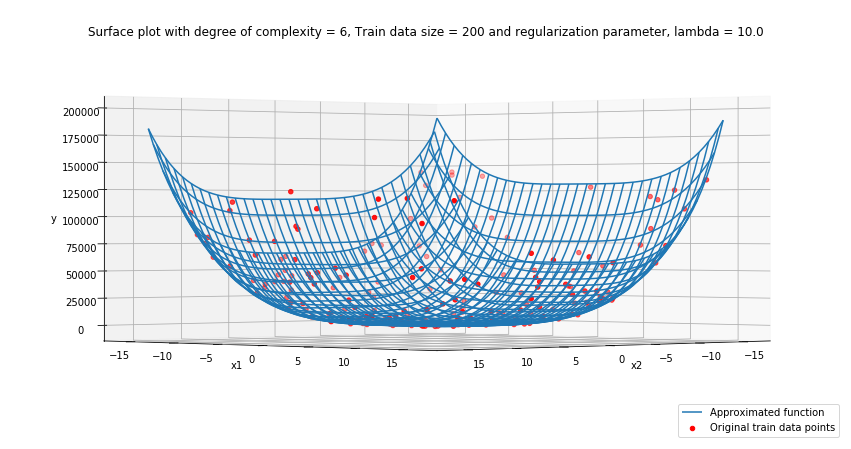

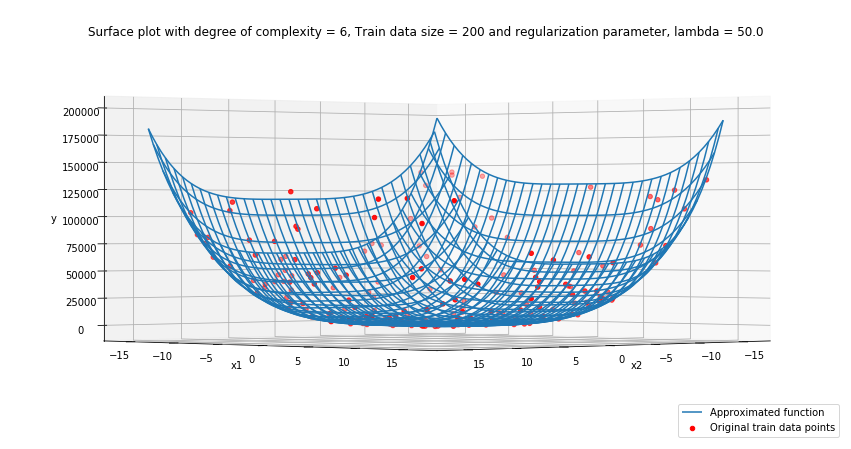

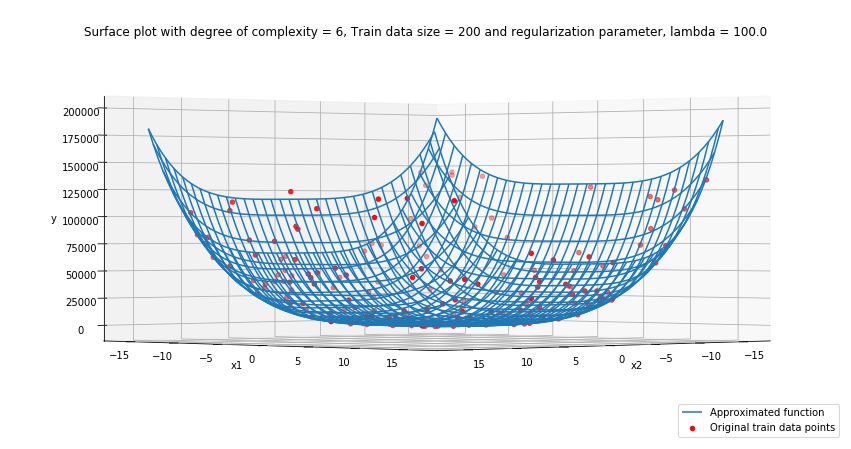

In [89]:
for l in lambda_list:
    plot_approxY(6, w_6_200,y6_train200,y6_trainpred200[l],200,l,x16_train200,x26_train200)

## 2.13 For degree of complexity = 6 and train data size = 500

In [90]:
data6_train500,data6_cv500,data6_test500=create_datasets(func2d,500,200)
x16_train500,x26_train500,y6_train500,x16_cv500,x26_cv500,y6_cv500,x16_test500,x26_test500,y6_test500=split_cols(data6_train500,data6_cv500,data6_test500)

### design matrix:
phi6_train500=create_phi(6,len(y6_train500),x16_train500,x26_train500)
phi6_cv500=create_phi(6,len(y6_cv500),x16_cv500,x26_cv500)
phi6_test500=create_phi(6,len(y6_test500),x16_test500,x26_test500)

y6_testpred500={}
y6_trainpred500={}
y6_cvpred500={}
lambda_list=[0,0.5,1,2,10,50,100]
rmse6_train500=[]
rmse6_test500=[]
rmse6_cv500=[]

for l in lambda_list:
    w_6_500=opt_regularized_param(l,phi6_train500,y6_train500);
    y6_trainpred500[l]=y_pred(phi6_train500,w_6_500)
    y6_testpred500[l]=y_pred(phi6_test500,w_6_500);
    y6_cvpred500[l]=y_pred(phi6_cv500,w_6_500);
    rmse6_train500.append(RMSE(y6_trainpred500[l],y6_train500))
    rmse6_test500.append(RMSE(y6_testpred500[l],y6_test500))
    rmse6_cv500.append(RMSE(y6_cvpred500[l],y6_cv500))
    

In [91]:
data6_500=pd.DataFrame(list(zip(lambda_list,rmse6_train500,rmse6_cv500,rmse6_test500)),columns=["Lambda", "RMSE Train","RMSE CV","RMSE test"])

In [93]:
data6_500.to_csv("rmse lambda complexity = 6 train = 500")

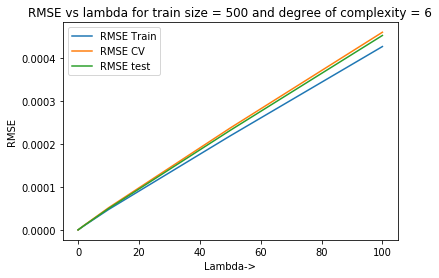

In [92]:
plt.figure()
plt.plot(data6_500["Lambda"],data6_500["RMSE Train"],label="RMSE Train")
plt.plot(data6_500["Lambda"],data6_500["RMSE CV"],label="RMSE CV")
plt.plot(data6_500["Lambda"],data6_500["RMSE test"],label="RMSE test")
plt.xlabel("Lambda->")
plt.ylabel("RMSE")
plt.legend()
plt.title("RMSE vs lambda for train size = 500 and degree of complexity = 6")
plt.savefig("d6_500.png")
plt.show()

In [ ]:
data6_500

### Surface plots for various values of lambda:

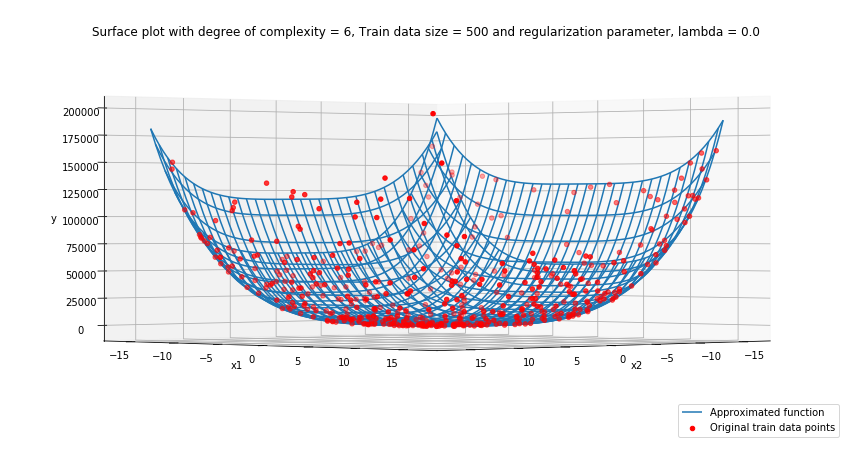

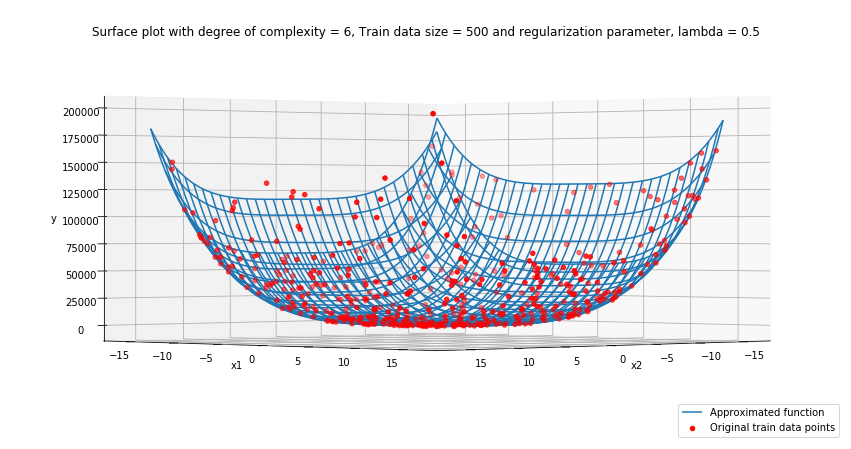

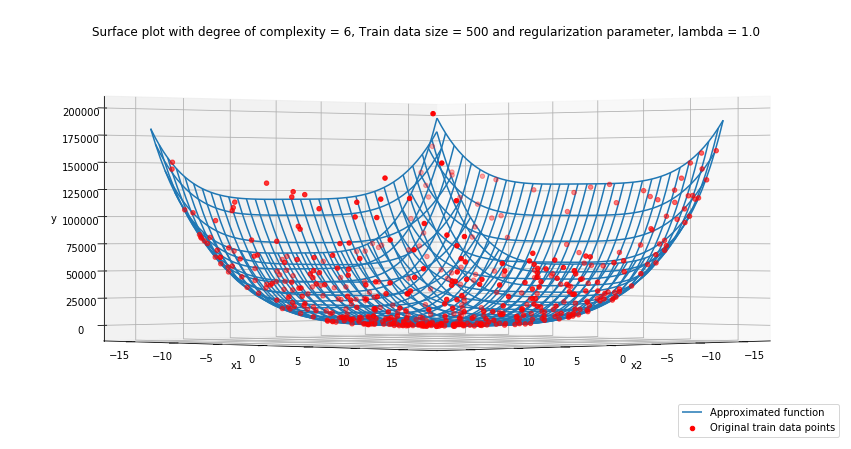

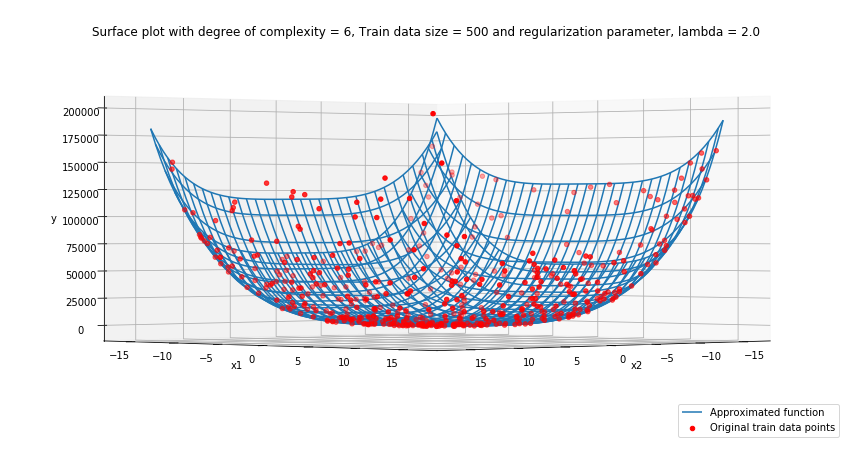

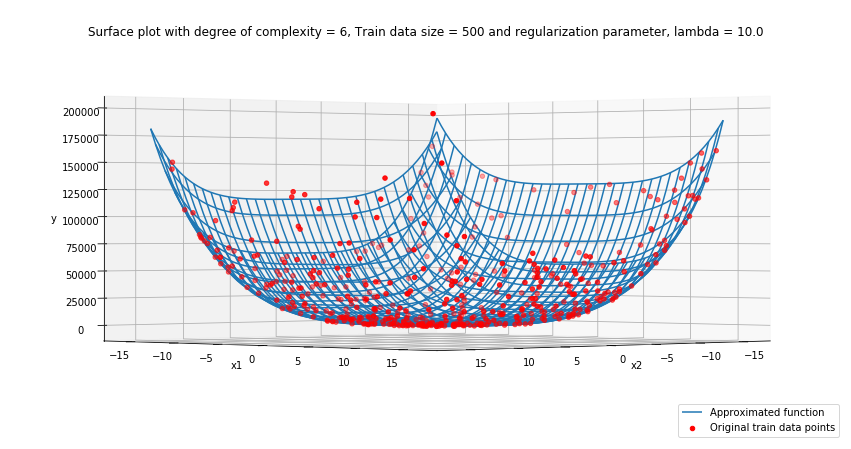

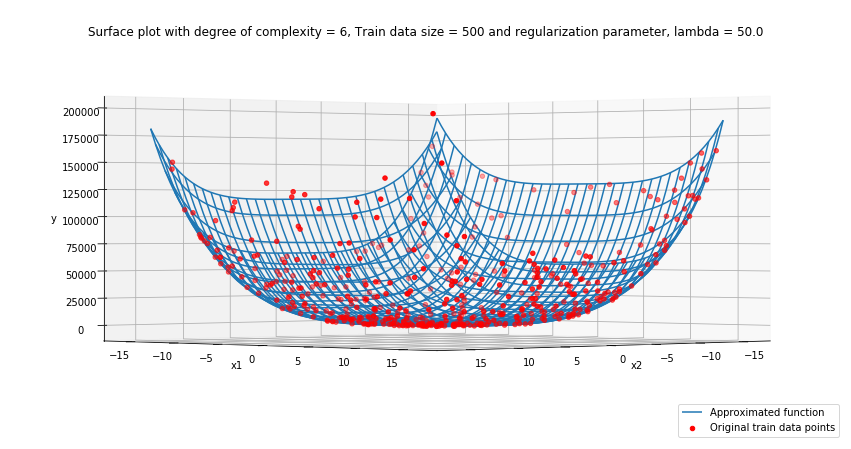

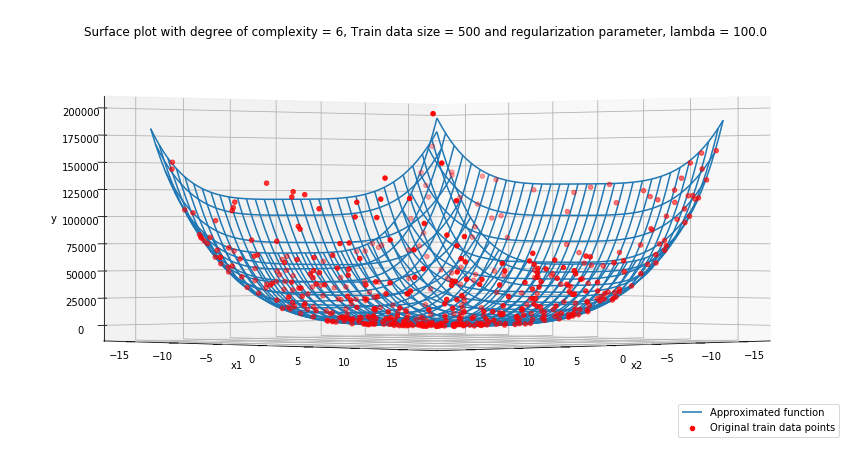

In [94]:
for l in lambda_list:
    plot_approxY(6, w_6_500,y6_train500,y6_trainpred500[l],500,l,x16_train500,x26_train500)

# Conclusion:

The model with best RMSE values over all three datasets: train, cross-validation and test is with degree of complexity 6, train data size = 500 and regularization parameter lambda = 0

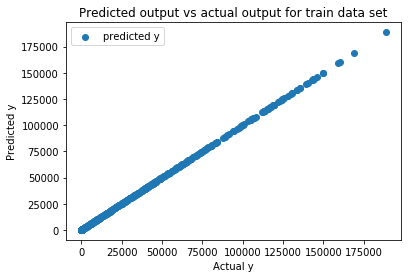

In [95]:
plt.figure()
plt.scatter(y6_train500,y6_trainpred500[0],label="predicted y")
plt.legend()
plt.xlabel("Actual y")
plt.ylabel("Predicted y")
plt.title("Predicted output vs actual output for train data set")
plt.savefig("predgoodtrain.png")
plt.show()


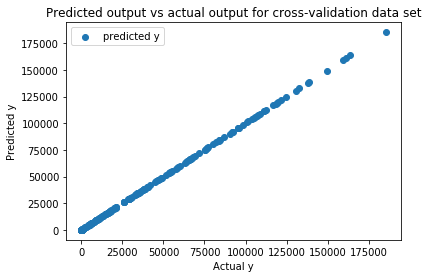

In [96]:
plt.figure()
plt.scatter(y6_cv500,y6_cvpred500[0],label="predicted y")
plt.legend()
plt.xlabel("Actual y")
plt.ylabel("Predicted y")
plt.title("Predicted output vs actual output for cross-validation data set")
plt.savefig("predcv.png")
plt.show()

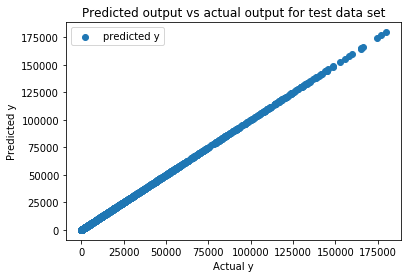

In [97]:
plt.figure()
plt.scatter(y6_test500,y6_testpred500[0],label="predicted y")
plt.legend()
plt.xlabel("Actual y")
plt.ylabel("Predicted y")
plt.title("Predicted output vs actual output for test data set")
plt.savefig("predtest.png")
plt.show()

In [ ]:
### rmse train:
rmse6_train500[0]

In [ ]:
### rmse cross validation:
rmse6_cv500[0]

In [ ]:
### rmse test data:
rmse6_test500[0]

In [ ]:
plt.figure()
plt.scatter(x16_train500,y6_train500)

In [ ]:
plt.figure()
plt.scatter(x26_train500,y6_train500)

In [ ]:
plt.figure()
plt.scatter(y6_trainpred500[0]-y6_train500)